# Data Analysis
This section is focused mainly on the following points:
- Reading from file
- Plotting the data into histograms
- Data Summary
- Outliers detection

The data set file structure must be as follows:
1. number_of_samples
2. number_of_atributes
3. number_of_different_targets_of_class
4. _samples_ (**the samples must be described with all its attributes separated by a single coma and each one in a new line**) 


### Imports Section

In [1]:
# Imports section
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import math

### Read the file in the format given

In [2]:
# Read the file in the format given
text=""
nLines=0
nAttributes=0
nClasses=0
attributesName = []
data = []
dataPerAttribute = []
classes = []
try:
    with open("cre300.txt","r") as file:
        count=0
        for line in file:
            if count < 3:
                if count == 0:
                    nLines = int(line.strip())
                else:
                    if count == 1:
                        nAttributes = int(line.strip())
                        for i in range(1,nAttributes+1):
                            attributesName.append("att"+str(i))
                            dataPerAttribute.append([])
                    else:
                        if count == 2:
                            nClasses = int(line.strip())
            else:
                split_string_S = line.strip().split(',')
                
                count_split = 0
                split_string_n = []
                for split in split_string_S:
                    if count_split >= nAttributes:
                        split_string_n.append(int(split))
                    else:
                        split_string_n.append(float(split))
                    count_split += 1
                    
                data.append(split_string_n)
                classes.append(split_string_n[nAttributes])
                n_attribute = 0
                for attribute in split_string_n:
                    if n_attribute >= nAttributes:
                        break
                    else:
                        dataPerAttribute[n_attribute].append(attribute)
                        n_attribute += 1
            count += 1
        print("EOF reached")
except FileNotFoundError:
    text="Archivo no existe"
    exit()
finally:
    file.close()
    # print(str(nLines) + "\n")
    # print(str(nAttributes) + "\n")
    # print(str(nClasses) + "\n")
    # print(attributesName)
    # print(data)

EOF reached


### Data Summary

In [3]:
# Data summary
# === Exceptions ===

class StatsError(ValueError):
    pass


# === Helper functions ===

def _getOccurencies(dataPoints):
    listOfTerms = {} # all terms found

    for x in dataPoints:
        if x in listOfTerms:
            listOfTerms[x] += 1
        else:
            listOfTerms[x] = 1
                    
    return listOfTerms    

def _diff_mean(x):
      # given a x data set, return an array with the distance between each
	# data point in x and the mean of the input data set x.
	x_bar = mean(x)
	return [x_i - x_bar for x_i in x]
    
# === Measures of central tendency (averages) ===
     
def mean(dataPoints, precision=3):
    """
    the arithmetic average of given data
    Arguments:
        dataPoints: a list of data points, int or float
        precision (optional): digits precision after the comma, default=3
    Returns:
        float, the mean of the input
        or StatsError if X is empty.
    """
    try:
        return round(sum(dataPoints) / float(len(dataPoints)), precision)
    except ZeroDivisionError:
        raise StatsError('no data points passed')

def median(dataPoints):
    """
    the median of given data
    Arguments:
        dataPoints: a list of data points, int or float
    Returns:
        the middle number in the sorted list, a float or an int
    """
    if not dataPoints:
        raise StatsError('no data points passed')
        
    sortedPoints = sorted(dataPoints)
    mid = len(sortedPoints) // 2  # uses the floor division to have integer returned
    if (len(sortedPoints) % 2 == 0):
        # even
        return (sortedPoints[mid-1] + sortedPoints[mid]) / 2.0
    else:
        # odd
        return sortedPoints[mid]
        
    
def mode(dataPoints):
    '''
    All modes (you can have multiple modes in a data set) of the given data
    Argument:
        dataPoints: a list of data points, int or float
    Returns:
        list, the most common number(s) in the argument list
    '''
    if not dataPoints:
        raise StatsError('no data points passed')
        
    dataAndOcc = _getOccurencies(dataPoints)
    
    maxOccurence = max(dataAndOcc.values())
    return [k for k,v in dataAndOcc.items() if v == maxOccurence]

# === Measures of spread ===
    
def stdDev(X, precision=3):
    """
    standard deviation of the given data (population)
    Argument:
        X: data points, a list of int
        precision (optional): digits precision after the comma, default=3
    Returns:
        float, the standard deviation of the input sample
    """

    tot = 0.0
    meanX = mean(X,10)

    for x in X:
        tot += (x - meanX) ** 2
    return round((tot/len(X))**0.5, precision)
        
def coeffVar(X, precision=3):
    """
    Coefficient of variation of the given data (population)
    Argument:
        X: data points, a list of int, do not mix negative and positive numbers
        precision (optional): digits precision after the comma, default=3
    Returns:
        float, the cv (measure of dispersion) of the input sample
        or raise StatsError('mean is zero') if the mean = 0
    """
    try:
        return round(stdDev(X, precision) / mean(X, precision), precision)
    except ZeroDivisionError:
        raise StatsError('mean is zero')
    
def stdDevOfLengths(L):
    """
    standard deviation of the lengths of given strings
    Argument:
        L: a list of strings
    Returns:
        float, the standard deviation of the lengths of the strings,
        or StatsError if L is empty.
    """
    if not L:
        raise StatsError('no data points passed')
        
    strLen = []
    for i in L:
        strLen.append(len(i))
    
    return stdDev(strLen)
  
# === Measures of range ===
def range(dataPoints):
    if not dataPoints:
        raise StatsError('no data points passed')
        
    return max(dataPoints) - min(dataPoints)

def quartiles(dataPoints):
    """
    the lower and upper quartile
    Arguments:
        dataPoints: a list of data points, int or float
    Returns:
        the first and the last quarter in the sorted list, a tuple of float or int
    """
    if not dataPoints:
        raise StatsError('no data points passed')
        
    sortedPoints = sorted(dataPoints)
    mid = len(sortedPoints) // 2 # uses the floor division to have integer returned
    
    if (len(sortedPoints) % 2 == 0):
        # even
        lowerQ = median(sortedPoints[:mid])
        upperQ = median(sortedPoints[mid:])
    else:
        # odd
        lowerQ = median(sortedPoints[:mid])
        upperQ = median(sortedPoints[mid+1:])
            
    return (lowerQ, upperQ)

# === Summary ===
def summary(dataPoints):
    if not dataPoints:
        raise StatsError('no data points passed')
    q_1,q_3 = quartiles(dataPoints)
    print ("Summary statistics")
    print ("Min      : ", min(dataPoints))
    print ("Lower Qu.: ", q_1)
    print ("Median   : ", median(dataPoints))
    print ("Mean     : ", mean(dataPoints))
    print ("Upper Qu.: ", q_3)
    print ("Max      : ", max(dataPoints))
    return "That's all" # this avoids printing None
def outlierDetection(low,up,dataSet):
    outliers = []
    for data in dataSet:
        if (data < low) or (data > up) :
            outliers.append(data)
    return outliers

### Turning information into histograms and outliers detection


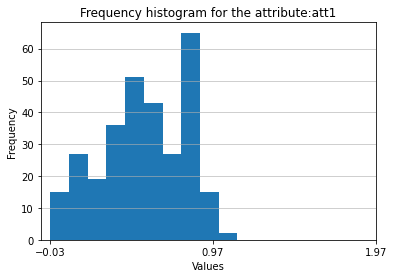

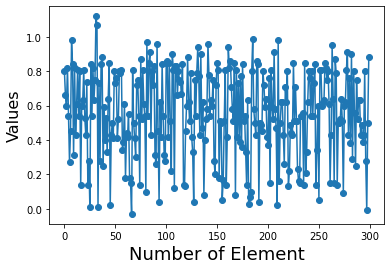

Summary statistics
Min      :  -0.03
Lower Qu.:  0.405
Median   :  0.56
Mean     :  0.553
Upper Qu.:  0.8
Max      :  1.12
OutLiers
No outliers


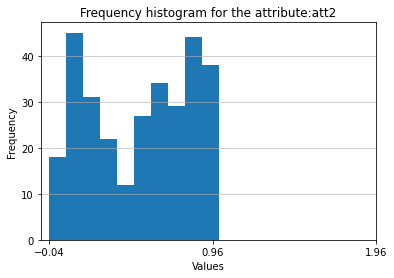

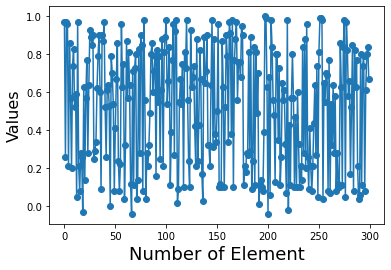

Summary statistics
Min      :  -0.04
Lower Qu.:  0.21
Median   :  0.57
Mean     :  0.517
Upper Qu.:  0.805
Max      :  1.0
OutLiers
No outliers


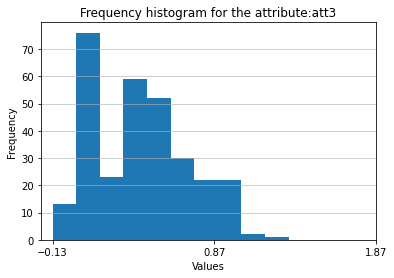

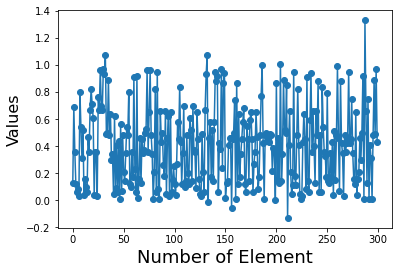

Summary statistics
Min      :  -0.13
Lower Qu.:  0.14
Median   :  0.42
Mean     :  0.413
Upper Qu.:  0.615
Max      :  1.33
OutLiers
1.33


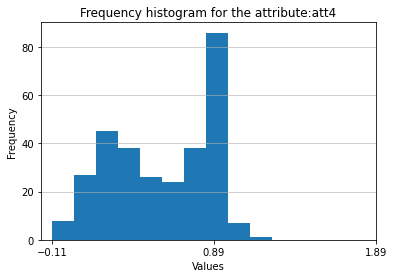

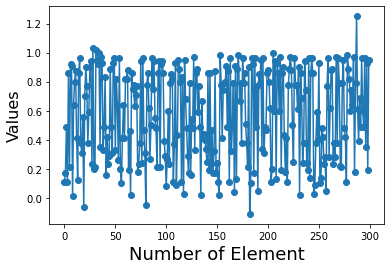

Summary statistics
Min      :  -0.11
Lower Qu.:  0.28
Median   :  0.6
Mean     :  0.572
Upper Qu.:  0.87
Max      :  1.25
OutLiers
No outliers


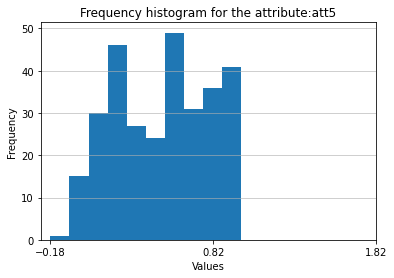

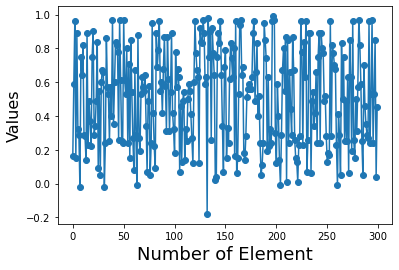

Summary statistics
Min      :  -0.18
Lower Qu.:  0.25
Median   :  0.54
Mean     :  0.509
Upper Qu.:  0.77
Max      :  0.99
OutLiers
No outliers


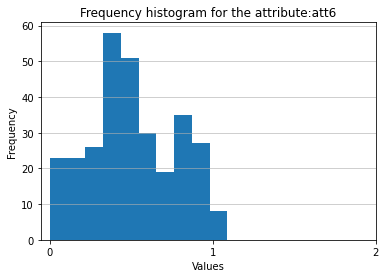

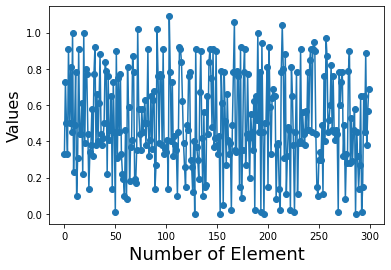

Summary statistics
Min      :  0.0
Lower Qu.:  0.33
Median   :  0.45
Mean     :  0.501
Upper Qu.:  0.76
Max      :  1.09
OutLiers
No outliers


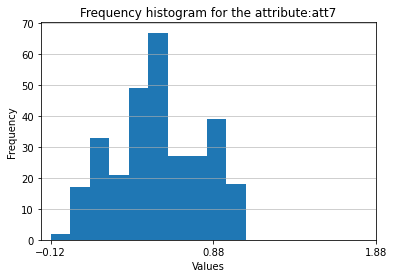

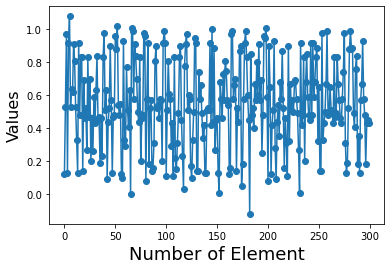

Summary statistics
Min      :  -0.12
Lower Qu.:  0.41
Median   :  0.52
Mean     :  0.549
Upper Qu.:  0.81
Max      :  1.08
OutLiers
No outliers


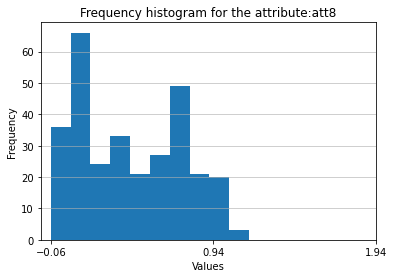

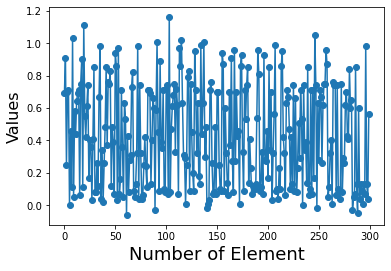

Summary statistics
Min      :  -0.06
Lower Qu.:  0.1
Median   :  0.4
Mean     :  0.429
Upper Qu.:  0.71
Max      :  1.16
OutLiers
No outliers


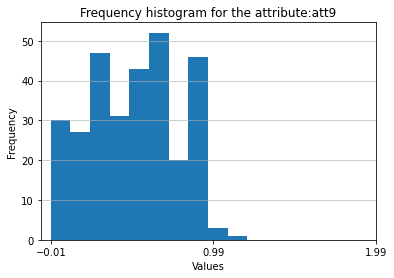

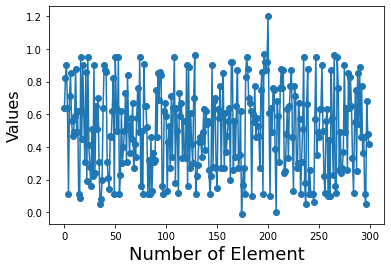

Summary statistics
Min      :  -0.01
Lower Qu.:  0.27
Median   :  0.505
Mean     :  0.506
Upper Qu.:  0.7
Max      :  1.2
OutLiers
No outliers


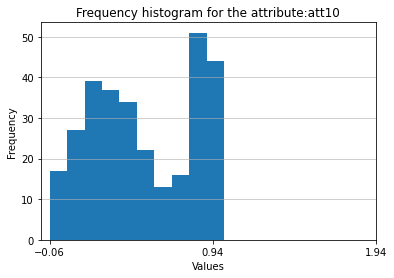

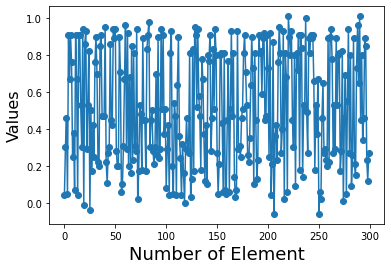

Summary statistics
Min      :  -0.06
Lower Qu.:  0.24
Median   :  0.47
Mean     :  0.508
Upper Qu.:  0.81
Max      :  1.01
OutLiers
No outliers


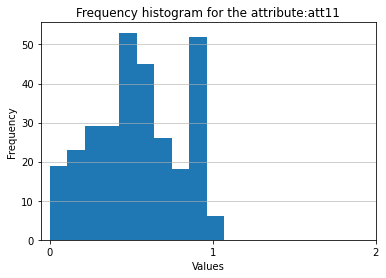

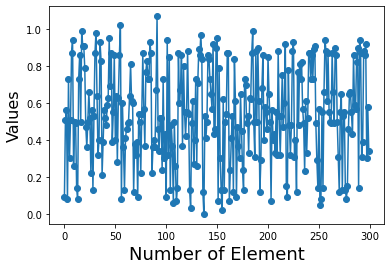

Summary statistics
Min      :  0.0
Lower Qu.:  0.34
Median   :  0.53
Mean     :  0.536
Upper Qu.:  0.76
Max      :  1.07
OutLiers
No outliers


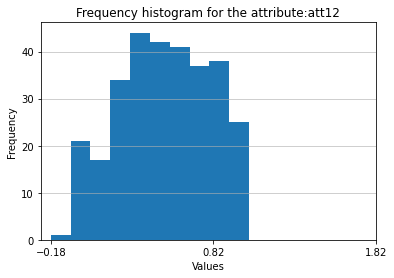

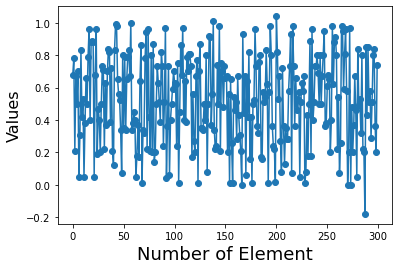

Summary statistics
Min      :  -0.18
Lower Qu.:  0.315
Median   :  0.515
Mean     :  0.52
Upper Qu.:  0.735
Max      :  1.04
OutLiers
No outliers


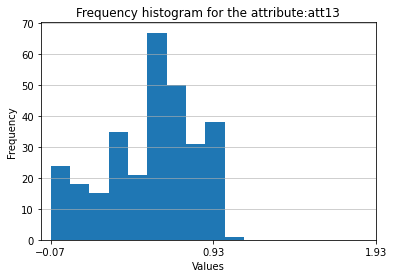

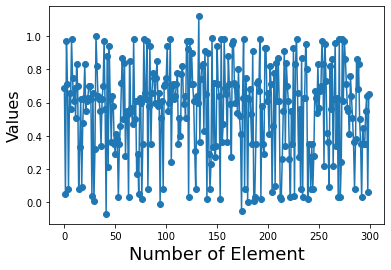

Summary statistics
Min      :  -0.07
Lower Qu.:  0.35
Median   :  0.61
Mean     :  0.552
Upper Qu.:  0.75
Max      :  1.12
OutLiers
No outliers


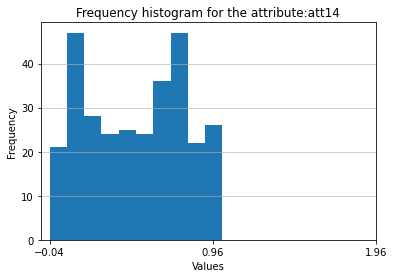

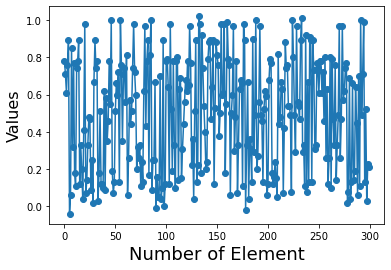

Summary statistics
Min      :  -0.04
Lower Qu.:  0.19
Median   :  0.51
Mean     :  0.495
Upper Qu.:  0.76
Max      :  1.02
OutLiers
No outliers


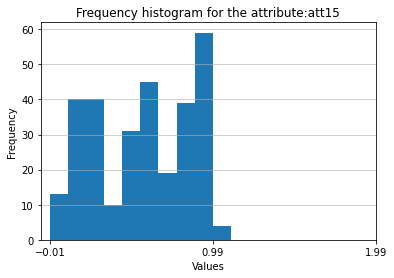

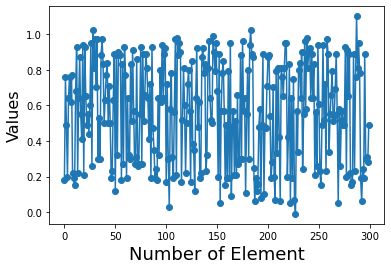

Summary statistics
Min      :  -0.01
Lower Qu.:  0.27
Median   :  0.57
Mean     :  0.562
Upper Qu.:  0.83
Max      :  1.1
OutLiers
No outliers


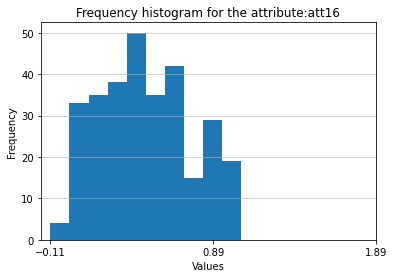

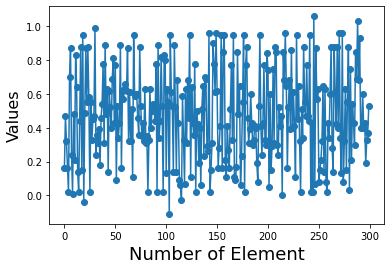

Summary statistics
Min      :  -0.11
Lower Qu.:  0.28
Median   :  0.45
Mean     :  0.472
Upper Qu.:  0.65
Max      :  1.06
OutLiers
No outliers


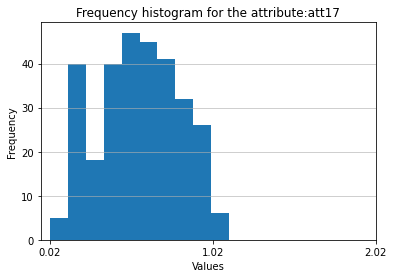

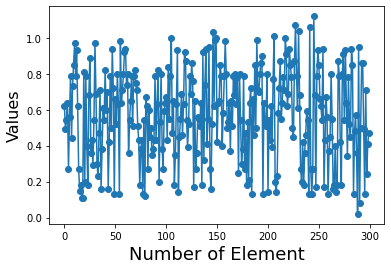

Summary statistics
Min      :  0.02
Lower Qu.:  0.385
Median   :  0.575
Mean     :  0.568
Upper Qu.:  0.79
Max      :  1.12
OutLiers
No outliers


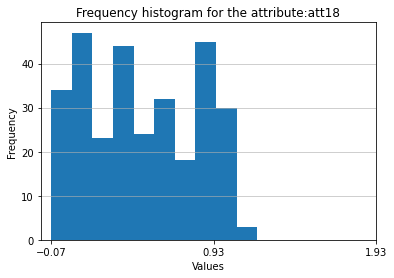

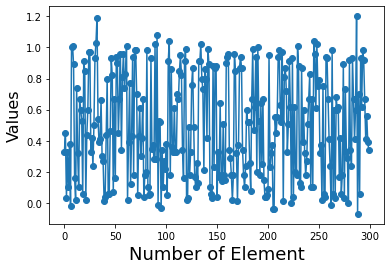

Summary statistics
Min      :  -0.07
Lower Qu.:  0.18
Median   :  0.445
Mean     :  0.492
Upper Qu.:  0.83
Max      :  1.2
OutLiers
No outliers


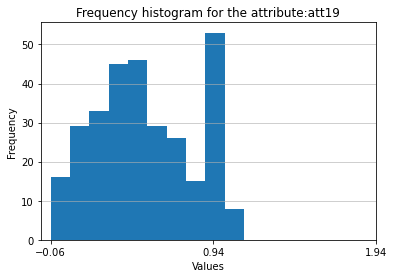

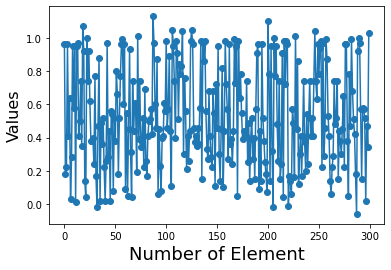

Summary statistics
Min      :  -0.06
Lower Qu.:  0.28
Median   :  0.485
Mean     :  0.528
Upper Qu.:  0.78
Max      :  1.13
OutLiers
No outliers


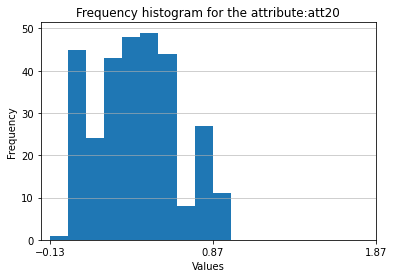

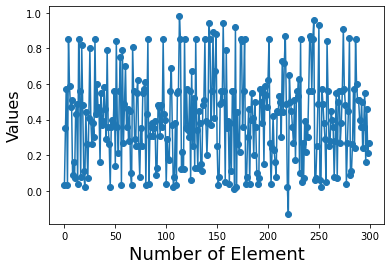

Summary statistics
Min      :  -0.13
Lower Qu.:  0.225
Median   :  0.39
Mean     :  0.405
Upper Qu.:  0.56
Max      :  0.98
OutLiers
No outliers


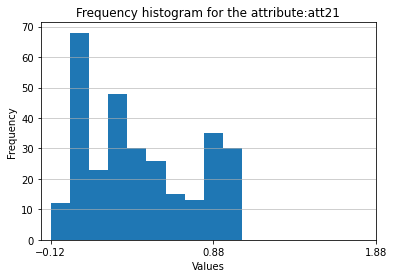

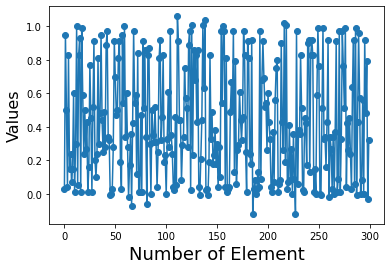

Summary statistics
Min      :  -0.12
Lower Qu.:  0.08499999999999999
Median   :  0.35
Mean     :  0.421
Upper Qu.:  0.76
Max      :  1.06
OutLiers
No outliers


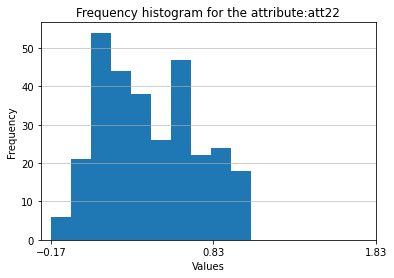

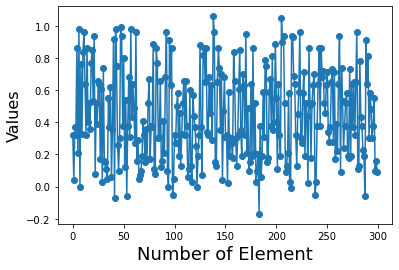

Summary statistics
Min      :  -0.17
Lower Qu.:  0.19
Median   :  0.38
Mean     :  0.442
Upper Qu.:  0.66
Max      :  1.06
OutLiers
No outliers


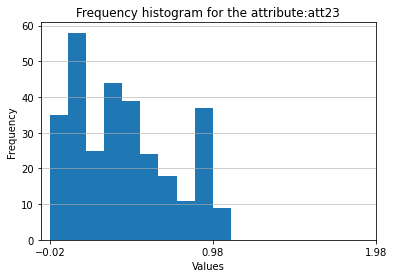

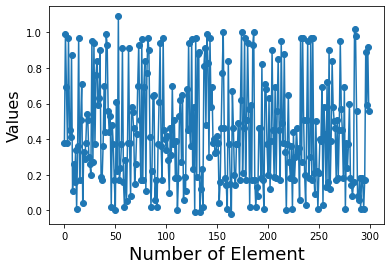

Summary statistics
Min      :  -0.02
Lower Qu.:  0.18
Median   :  0.38
Mean     :  0.436
Upper Qu.:  0.645
Max      :  1.09
OutLiers
No outliers


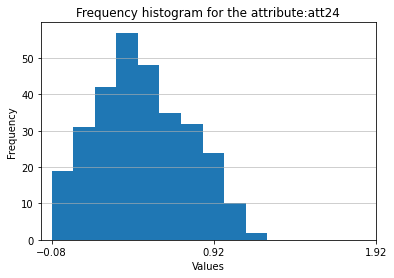

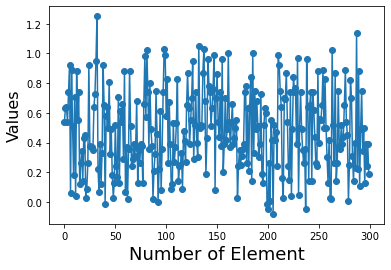

Summary statistics
Min      :  -0.08
Lower Qu.:  0.26
Median   :  0.46499999999999997
Mean     :  0.477
Upper Qu.:  0.695
Max      :  1.25
OutLiers
No outliers


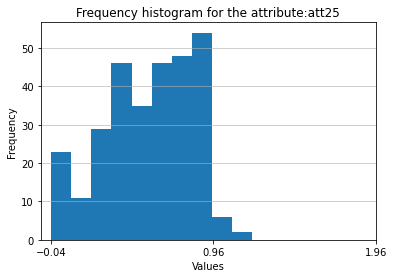

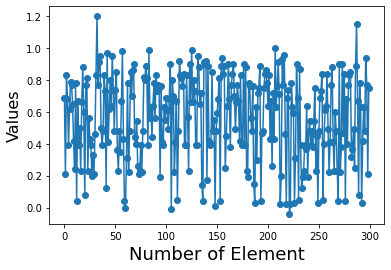

Summary statistics
Min      :  -0.04
Lower Qu.:  0.39
Median   :  0.615
Mean     :  0.56
Upper Qu.:  0.78
Max      :  1.2
OutLiers
No outliers


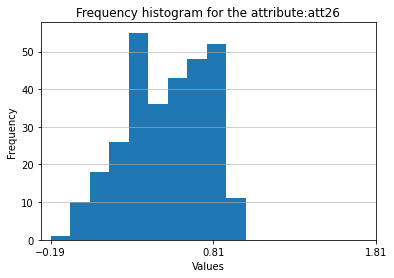

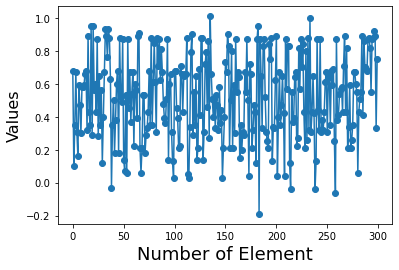

Summary statistics
Min      :  -0.19
Lower Qu.:  0.32
Median   :  0.535
Mean     :  0.519
Upper Qu.:  0.69
Max      :  1.01
OutLiers
No outliers


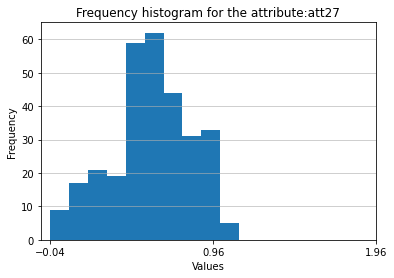

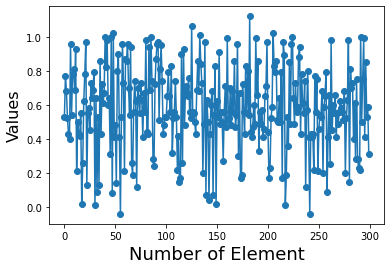

Summary statistics
Min      :  -0.04
Lower Qu.:  0.43
Median   :  0.56
Mean     :  0.579
Upper Qu.:  0.745
Max      :  1.12
OutLiers
No outliers


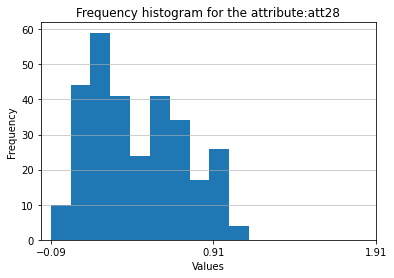

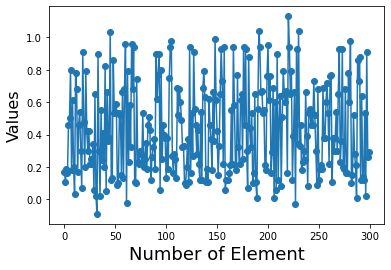

Summary statistics
Min      :  -0.09
Lower Qu.:  0.19
Median   :  0.38
Mean     :  0.434
Upper Qu.:  0.65
Max      :  1.13
OutLiers
No outliers


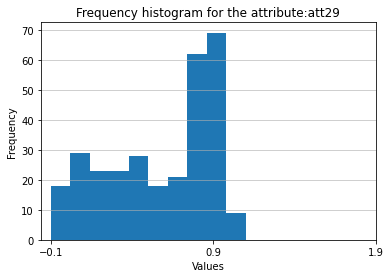

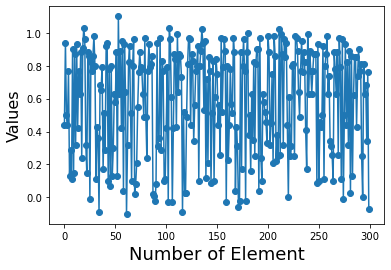

Summary statistics
Min      :  -0.1
Lower Qu.:  0.31
Median   :  0.635
Mean     :  0.579
Upper Qu.:  0.87
Max      :  1.1
OutLiers
No outliers


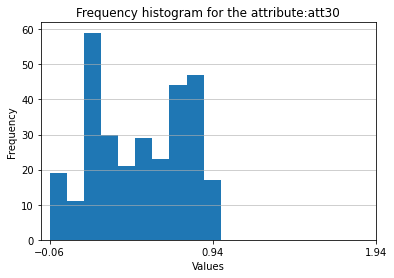

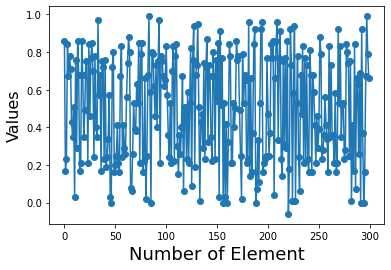

Summary statistics
Min      :  -0.06
Lower Qu.:  0.23
Median   :  0.515
Mean     :  0.495
Upper Qu.:  0.76
Max      :  0.99
OutLiers
No outliers


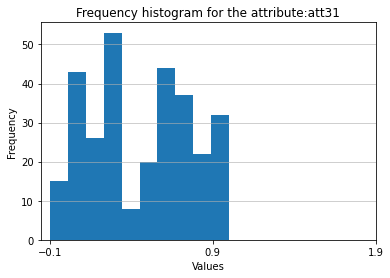

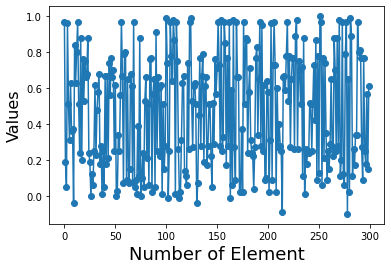

Summary statistics
Min      :  -0.1
Lower Qu.:  0.2
Median   :  0.51
Mean     :  0.468
Upper Qu.:  0.74
Max      :  1.0
OutLiers
No outliers


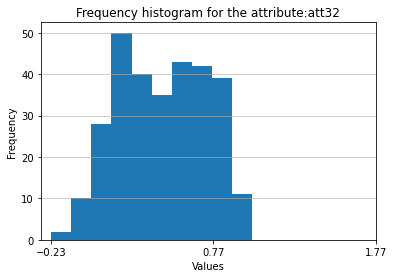

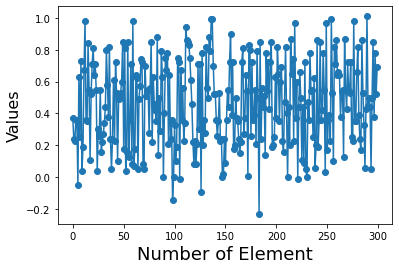

Summary statistics
Min      :  -0.23
Lower Qu.:  0.24
Median   :  0.46
Mean     :  0.462
Upper Qu.:  0.7
Max      :  1.01
OutLiers
No outliers


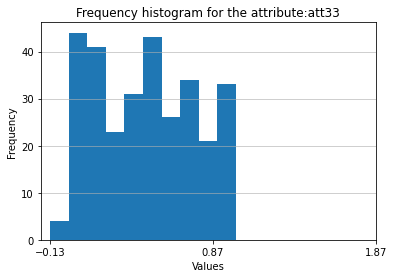

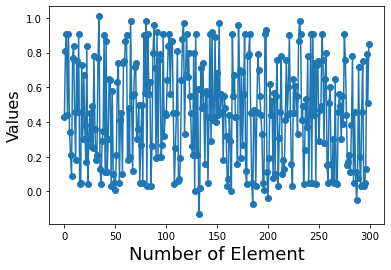

Summary statistics
Min      :  -0.13
Lower Qu.:  0.185
Median   :  0.45
Mean     :  0.457
Upper Qu.:  0.735
Max      :  1.01
OutLiers
No outliers


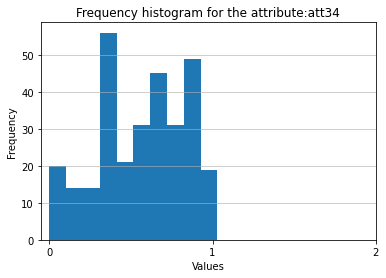

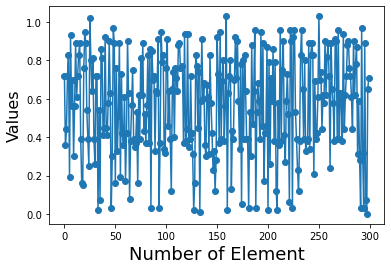

Summary statistics
Min      :  0.0
Lower Qu.:  0.38
Median   :  0.6
Mean     :  0.566
Upper Qu.:  0.8
Max      :  1.03
OutLiers
No outliers


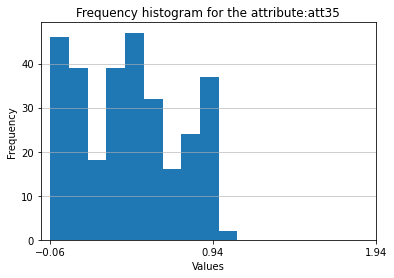

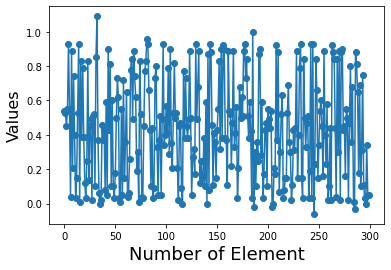

Summary statistics
Min      :  -0.06
Lower Qu.:  0.15
Median   :  0.43
Mean     :  0.431
Upper Qu.:  0.67
Max      :  1.09
OutLiers
No outliers


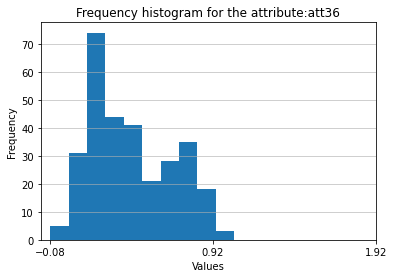

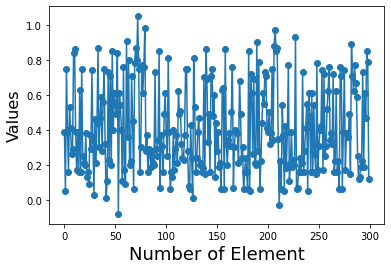

Summary statistics
Min      :  -0.08
Lower Qu.:  0.2
Median   :  0.37
Mean     :  0.406
Upper Qu.:  0.61
Max      :  1.05
OutLiers
No outliers


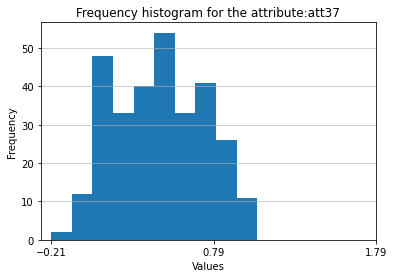

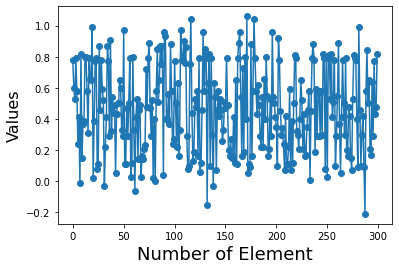

Summary statistics
Min      :  -0.21
Lower Qu.:  0.22
Median   :  0.46499999999999997
Mean     :  0.467
Upper Qu.:  0.75
Max      :  1.06
OutLiers
No outliers


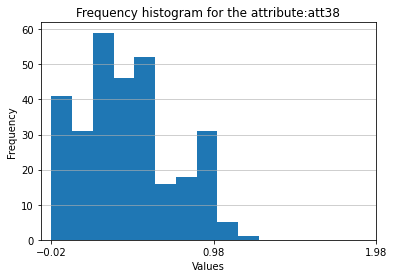

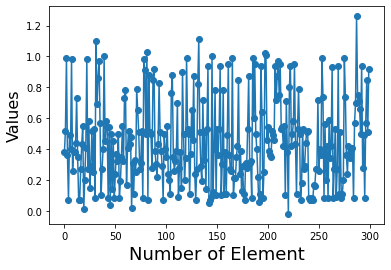

Summary statistics
Min      :  -0.02
Lower Qu.:  0.24
Median   :  0.4
Mean     :  0.447
Upper Qu.:  0.58
Max      :  1.26
OutLiers
1.1
1.11
1.26


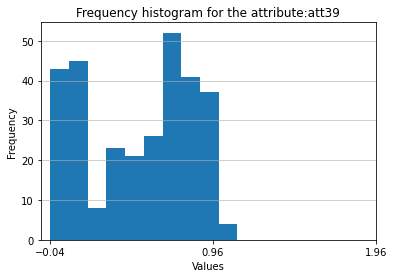

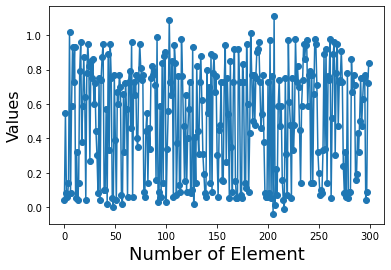

Summary statistics
Min      :  -0.04
Lower Qu.:  0.14
Median   :  0.59
Mean     :  0.509
Upper Qu.:  0.77
Max      :  1.11
OutLiers
No outliers


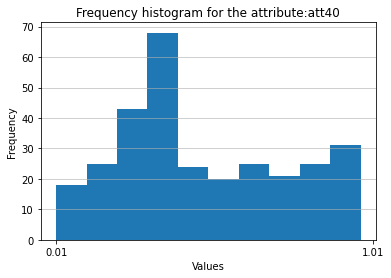

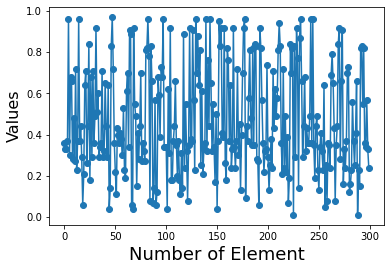

Summary statistics
Min      :  0.01
Lower Qu.:  0.28
Median   :  0.38
Mean     :  0.471
Upper Qu.:  0.7
Max      :  0.97
OutLiers
No outliers


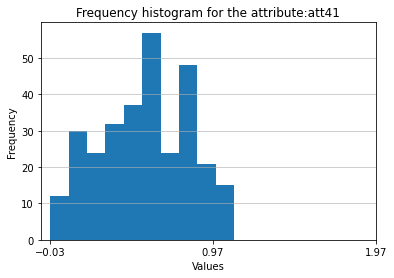

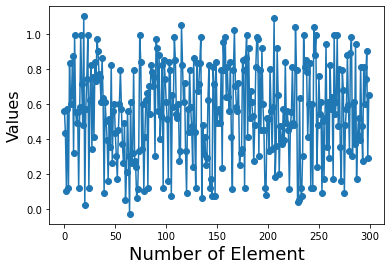

Summary statistics
Min      :  -0.03
Lower Qu.:  0.335
Median   :  0.56
Mean     :  0.55
Upper Qu.:  0.79
Max      :  1.1
OutLiers
No outliers


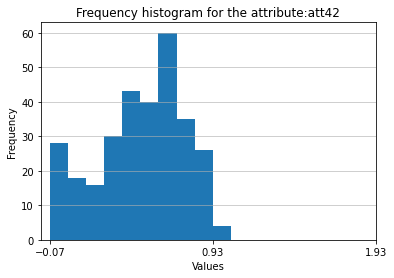

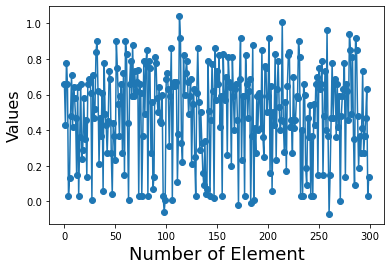

Summary statistics
Min      :  -0.07
Lower Qu.:  0.33
Median   :  0.555
Mean     :  0.497
Upper Qu.:  0.685
Max      :  1.04
OutLiers
No outliers


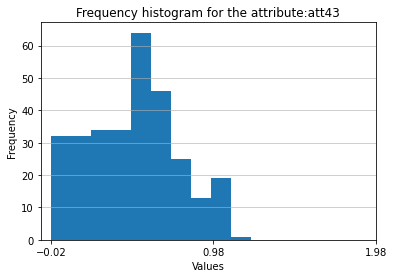

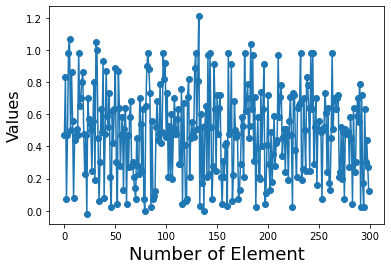

Summary statistics
Min      :  -0.02
Lower Qu.:  0.25
Median   :  0.495
Mean     :  0.487
Upper Qu.:  0.68
Max      :  1.21
OutLiers
No outliers


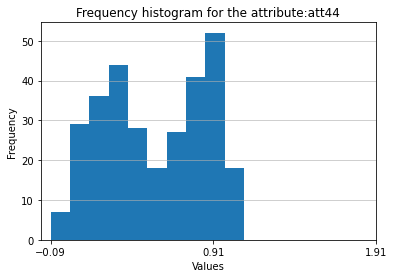

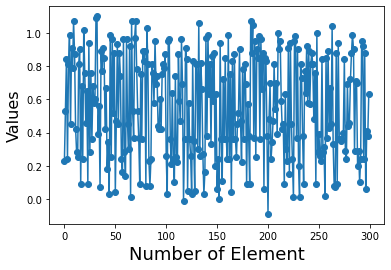

Summary statistics
Min      :  -0.09
Lower Qu.:  0.28
Median   :  0.55
Mean     :  0.552
Upper Qu.:  0.85
Max      :  1.1
OutLiers
No outliers


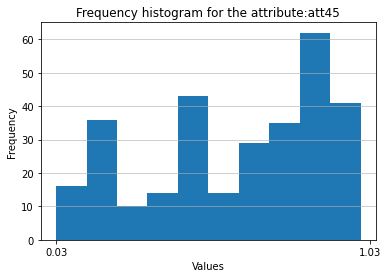

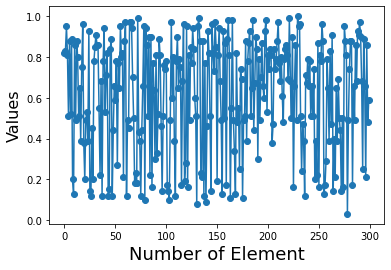

Summary statistics
Min      :  0.03
Lower Qu.:  0.395
Median   :  0.675
Mean     :  0.61
Upper Qu.:  0.855
Max      :  1.0
OutLiers
No outliers


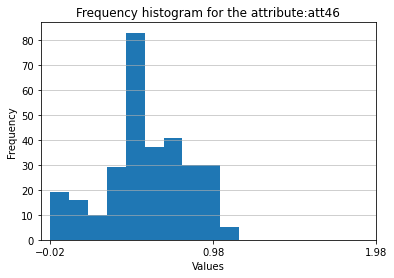

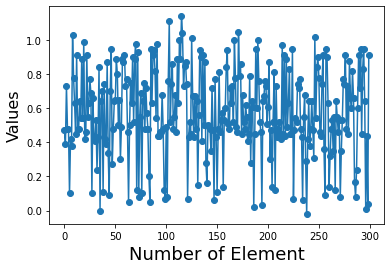

Summary statistics
Min      :  -0.02
Lower Qu.:  0.45
Median   :  0.545
Mean     :  0.573
Upper Qu.:  0.765
Max      :  1.14
OutLiers
No outliers


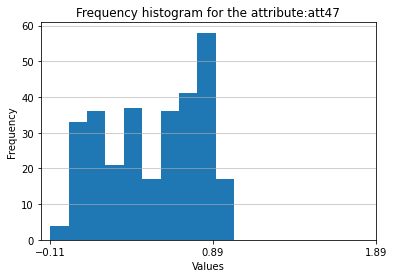

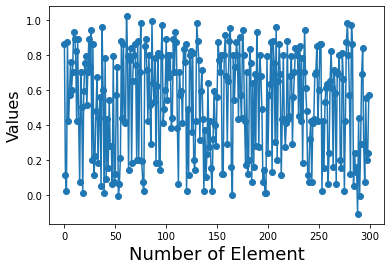

Summary statistics
Min      :  -0.11
Lower Qu.:  0.24
Median   :  0.57
Mean     :  0.518
Upper Qu.:  0.795
Max      :  1.02
OutLiers
No outliers


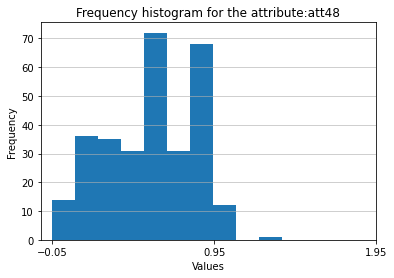

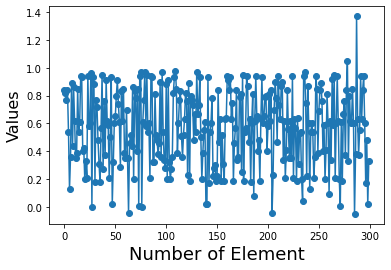

Summary statistics
Min      :  -0.05
Lower Qu.:  0.35
Median   :  0.6
Mean     :  0.571
Upper Qu.:  0.82
Max      :  1.37
OutLiers
No outliers


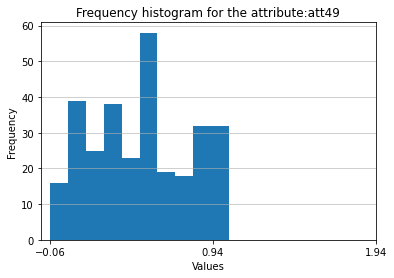

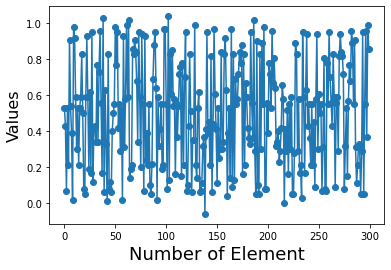

Summary statistics
Min      :  -0.06
Lower Qu.:  0.21
Median   :  0.53
Mean     :  0.495
Upper Qu.:  0.77
Max      :  1.04
OutLiers
No outliers


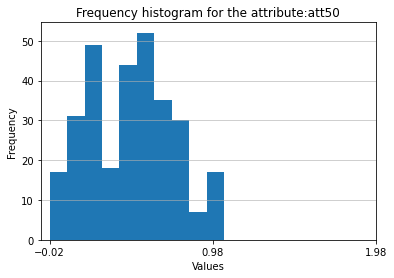

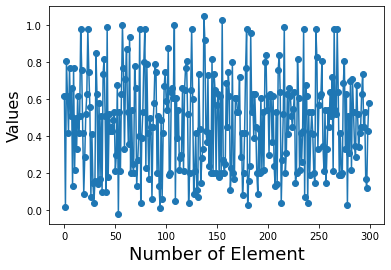

Summary statistics
Min      :  -0.02
Lower Qu.:  0.22
Median   :  0.5
Mean     :  0.471
Upper Qu.:  0.64
Max      :  1.05
OutLiers
No outliers


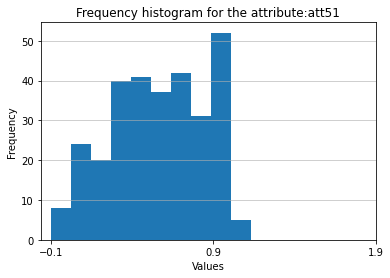

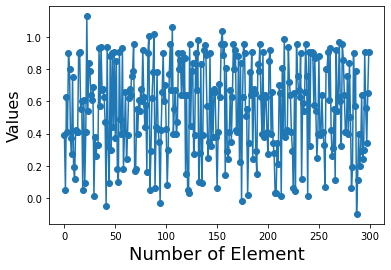

Summary statistics
Min      :  -0.1
Lower Qu.:  0.34
Median   :  0.595
Mean     :  0.552
Upper Qu.:  0.8
Max      :  1.13
OutLiers
No outliers


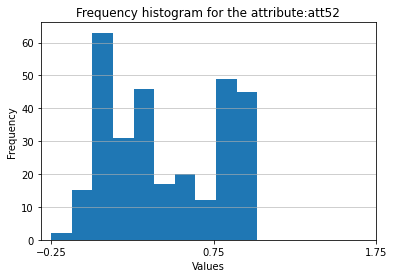

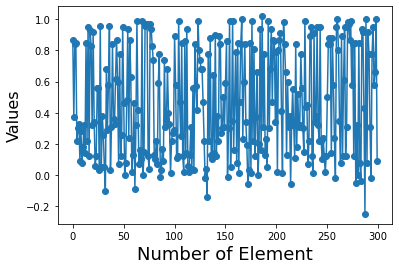

Summary statistics
Min      :  -0.25
Lower Qu.:  0.13
Median   :  0.36
Mean     :  0.456
Upper Qu.:  0.84
Max      :  1.02
OutLiers
No outliers


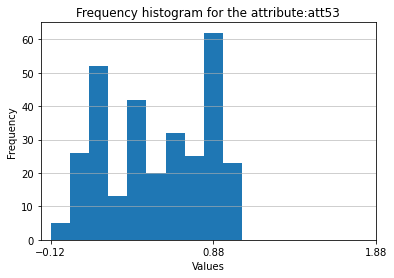

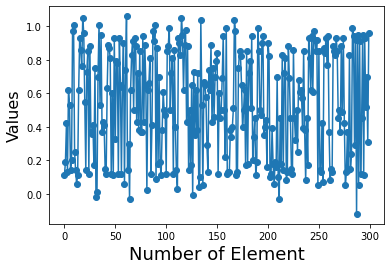

Summary statistics
Min      :  -0.12
Lower Qu.:  0.18
Median   :  0.51
Mean     :  0.529
Upper Qu.:  0.85
Max      :  1.06
OutLiers
No outliers


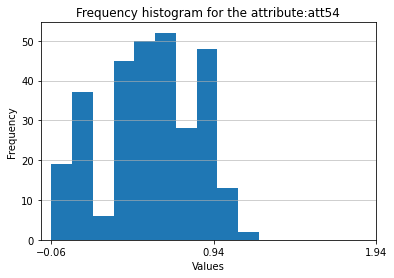

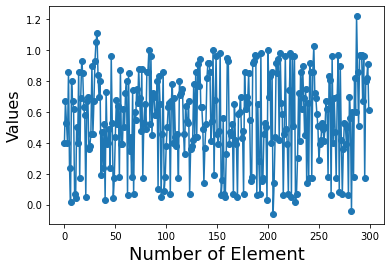

Summary statistics
Min      :  -0.06
Lower Qu.:  0.39
Median   :  0.545
Mean     :  0.549
Upper Qu.:  0.8
Max      :  1.22
OutLiers
No outliers


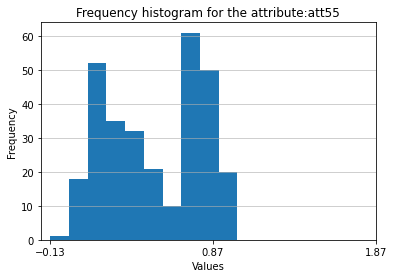

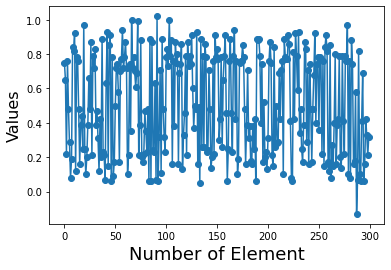

Summary statistics
Min      :  -0.13
Lower Qu.:  0.22
Median   :  0.48
Mean     :  0.512
Upper Qu.:  0.78
Max      :  1.02
OutLiers
No outliers


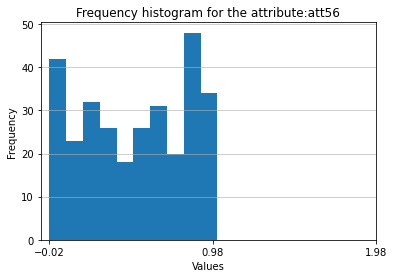

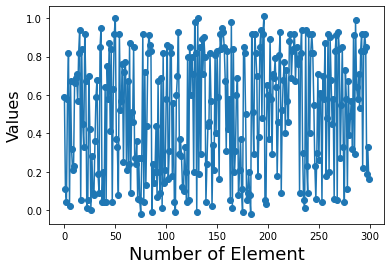

Summary statistics
Min      :  -0.02
Lower Qu.:  0.2
Median   :  0.565
Mean     :  0.502
Upper Qu.:  0.82
Max      :  1.01
OutLiers
No outliers


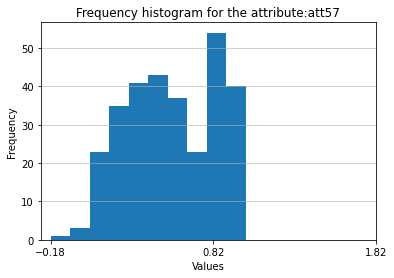

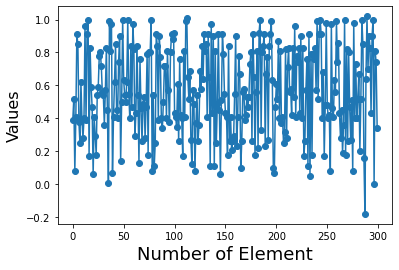

Summary statistics
Min      :  -0.18
Lower Qu.:  0.39
Median   :  0.54
Mean     :  0.563
Upper Qu.:  0.81
Max      :  1.02
OutLiers
No outliers


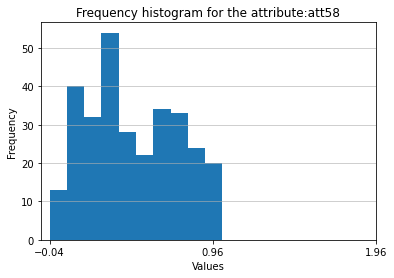

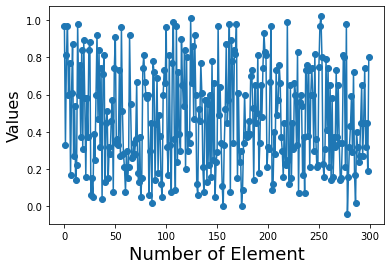

Summary statistics
Min      :  -0.04
Lower Qu.:  0.24
Median   :  0.45
Mean     :  0.47
Upper Qu.:  0.72
Max      :  1.02
OutLiers
No outliers


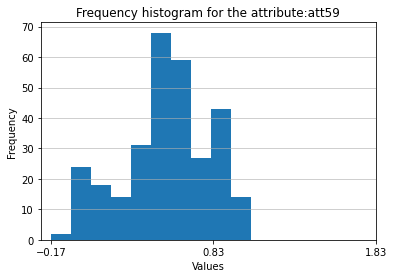

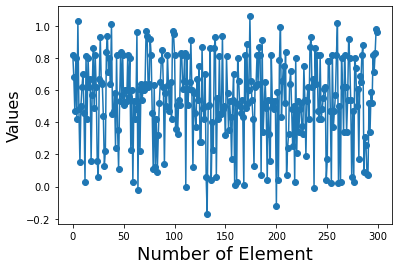

Summary statistics
Min      :  -0.17
Lower Qu.:  0.42
Median   :  0.54
Mean     :  0.536
Upper Qu.:  0.75
Max      :  1.06
OutLiers
-0.17
-0.12


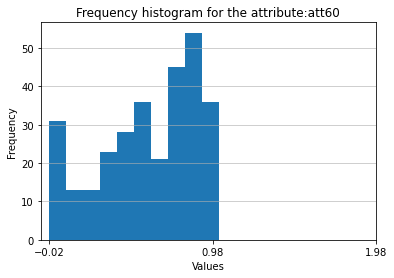

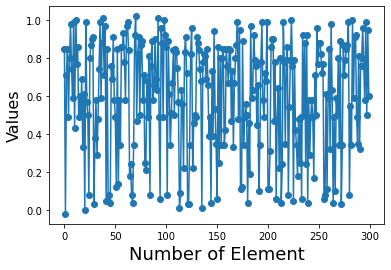

Summary statistics
Min      :  -0.02
Lower Qu.:  0.35
Median   :  0.63
Mean     :  0.591
Upper Qu.:  0.85
Max      :  1.02
OutLiers
No outliers


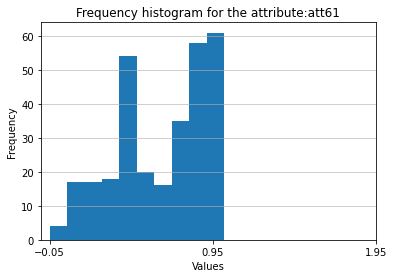

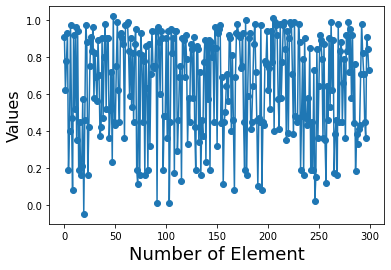

Summary statistics
Min      :  -0.05
Lower Qu.:  0.445
Median   :  0.71
Mean     :  0.641
Upper Qu.:  0.9
Max      :  1.02
OutLiers
No outliers


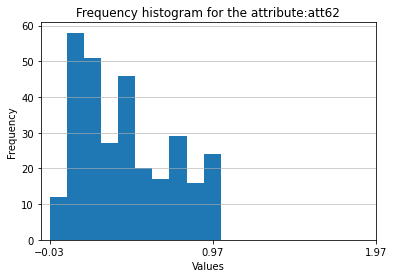

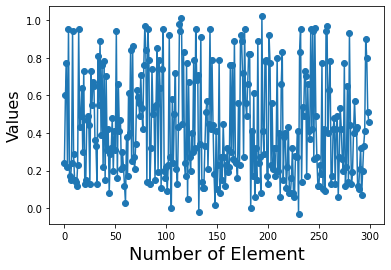

Summary statistics
Min      :  -0.03
Lower Qu.:  0.2
Median   :  0.4
Mean     :  0.431
Upper Qu.:  0.66
Max      :  1.02
OutLiers
No outliers


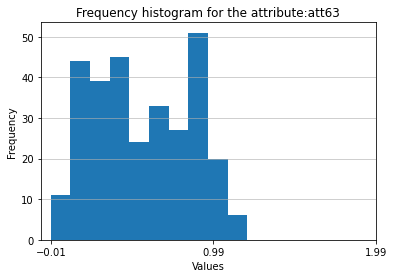

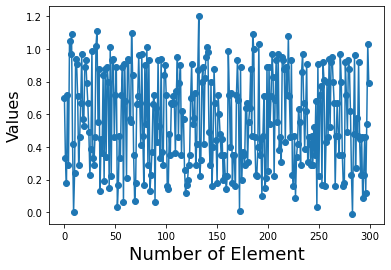

Summary statistics
Min      :  -0.01
Lower Qu.:  0.325
Median   :  0.54
Mean     :  0.562
Upper Qu.:  0.84
Max      :  1.2
OutLiers
No outliers


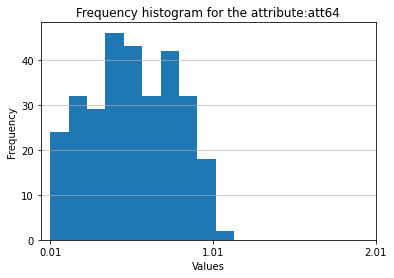

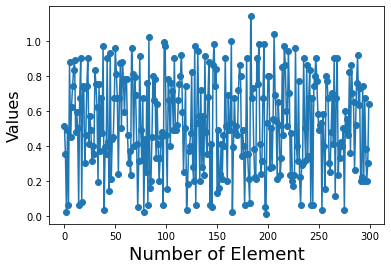

Summary statistics
Min      :  0.01
Lower Qu.:  0.31
Median   :  0.495
Mean     :  0.52
Upper Qu.:  0.745
Max      :  1.14
OutLiers
No outliers


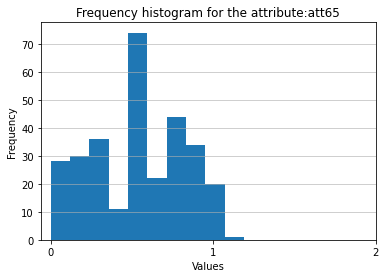

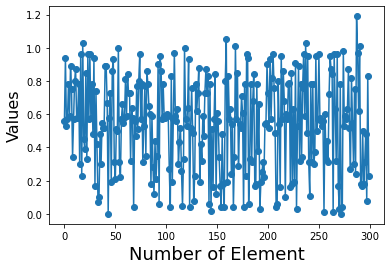

Summary statistics
Min      :  0.0
Lower Qu.:  0.31
Median   :  0.57
Mean     :  0.542
Upper Qu.:  0.78
Max      :  1.19
OutLiers
No outliers


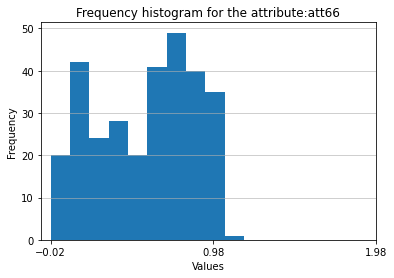

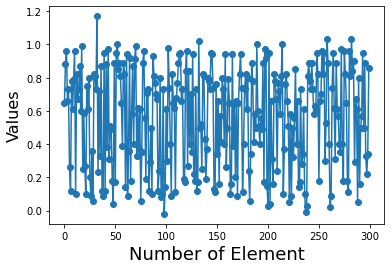

Summary statistics
Min      :  -0.02
Lower Qu.:  0.28500000000000003
Median   :  0.61
Mean     :  0.559
Upper Qu.:  0.82
Max      :  1.17
OutLiers
No outliers


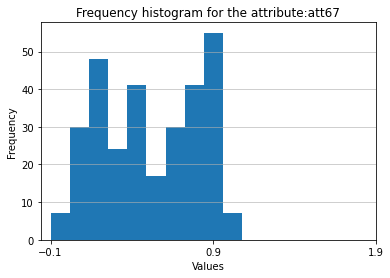

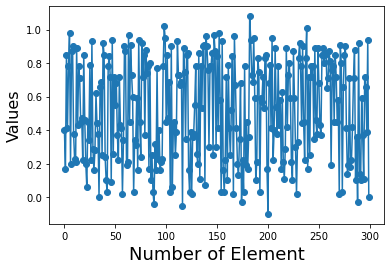

Summary statistics
Min      :  -0.1
Lower Qu.:  0.23
Median   :  0.495
Mean     :  0.517
Upper Qu.:  0.79
Max      :  1.08
OutLiers
No outliers


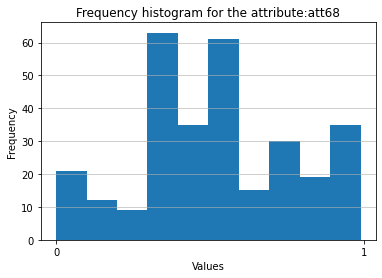

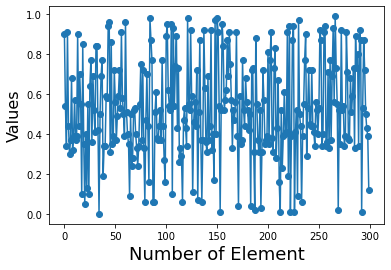

Summary statistics
Min      :  0.0
Lower Qu.:  0.36
Median   :  0.515
Mean     :  0.52
Upper Qu.:  0.72
Max      :  0.99
OutLiers
No outliers


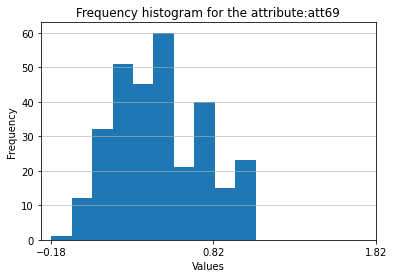

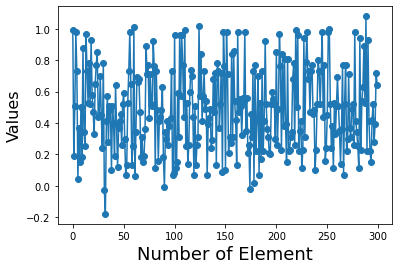

Summary statistics
Min      :  -0.18
Lower Qu.:  0.26
Median   :  0.47
Mean     :  0.486
Upper Qu.:  0.71
Max      :  1.08
OutLiers
No outliers


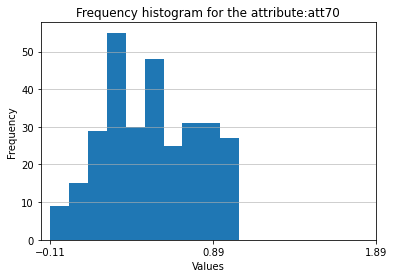

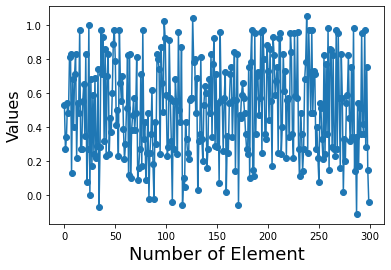

Summary statistics
Min      :  -0.11
Lower Qu.:  0.27
Median   :  0.5
Mean     :  0.507
Upper Qu.:  0.745
Max      :  1.05
OutLiers
No outliers


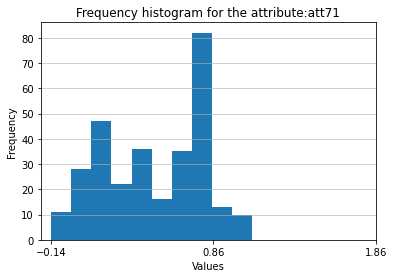

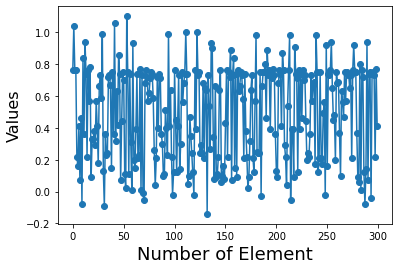

Summary statistics
Min      :  -0.14
Lower Qu.:  0.22
Median   :  0.56
Mean     :  0.488
Upper Qu.:  0.74
Max      :  1.1
OutLiers
No outliers


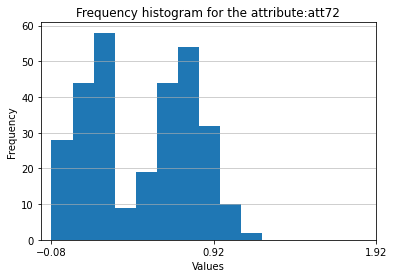

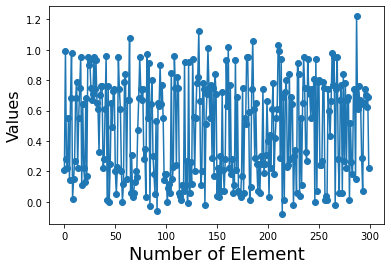

Summary statistics
Min      :  -0.08
Lower Qu.:  0.18
Median   :  0.55
Mean     :  0.477
Upper Qu.:  0.75
Max      :  1.22
OutLiers
No outliers


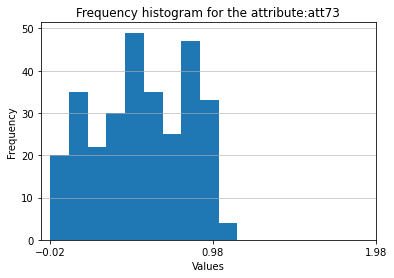

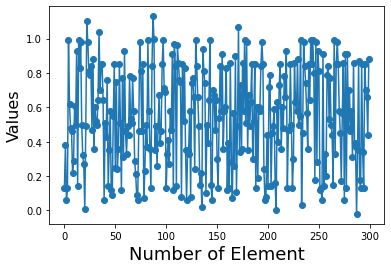

Summary statistics
Min      :  -0.02
Lower Qu.:  0.31
Median   :  0.52
Mean     :  0.539
Upper Qu.:  0.83
Max      :  1.13
OutLiers
No outliers


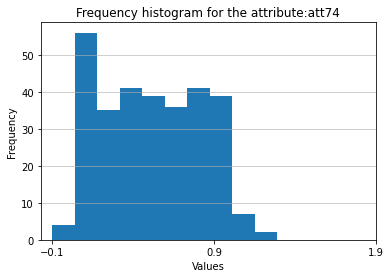

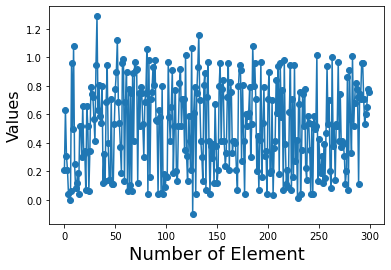

Summary statistics
Min      :  -0.1
Lower Qu.:  0.21
Median   :  0.52
Mean     :  0.512
Upper Qu.:  0.77
Max      :  1.29
OutLiers
No outliers


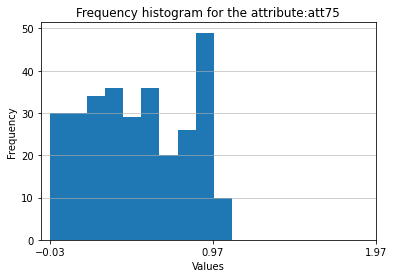

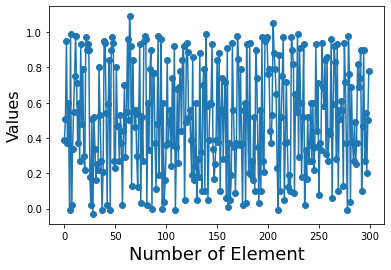

Summary statistics
Min      :  -0.03
Lower Qu.:  0.265
Median   :  0.51
Mean     :  0.507
Upper Qu.:  0.79
Max      :  1.09
OutLiers
No outliers


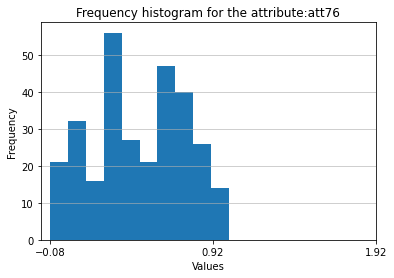

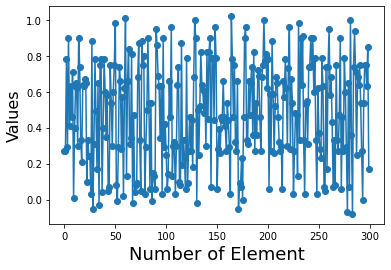

Summary statistics
Min      :  -0.08
Lower Qu.:  0.27
Median   :  0.47
Mean     :  0.475
Upper Qu.:  0.74
Max      :  1.02
OutLiers
No outliers


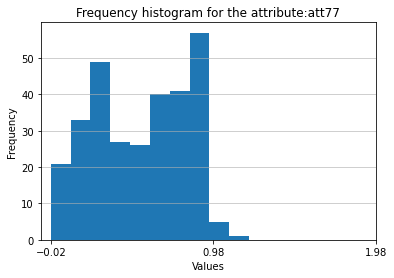

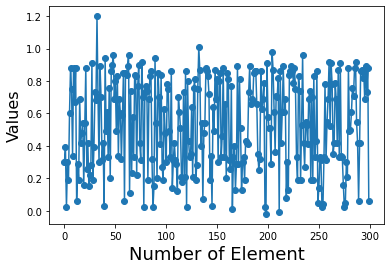

Summary statistics
Min      :  -0.02
Lower Qu.:  0.305
Median   :  0.54
Mean     :  0.536
Upper Qu.:  0.805
Max      :  1.2
OutLiers
No outliers


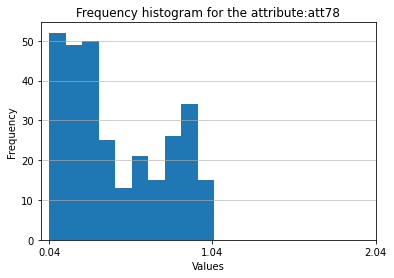

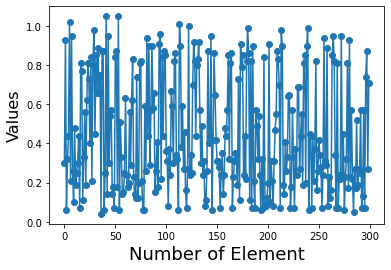

Summary statistics
Min      :  0.04
Lower Qu.:  0.21
Median   :  0.34
Mean     :  0.449
Upper Qu.:  0.745
Max      :  1.05
OutLiers
No outliers


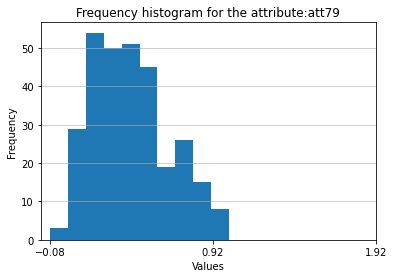

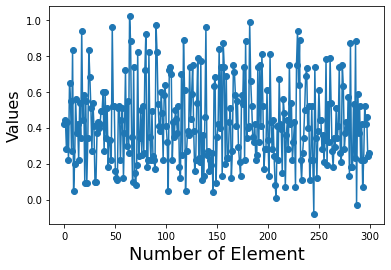

Summary statistics
Min      :  -0.08
Lower Qu.:  0.23
Median   :  0.4
Mean     :  0.42
Upper Qu.:  0.555
Max      :  1.02
OutLiers
No outliers


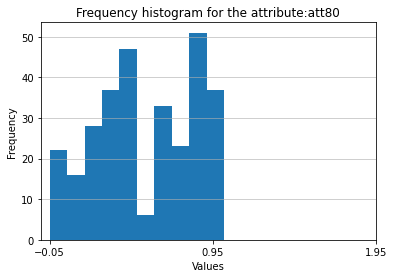

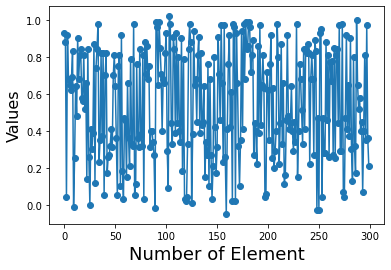

Summary statistics
Min      :  -0.05
Lower Qu.:  0.305
Median   :  0.495
Mean     :  0.539
Upper Qu.:  0.82
Max      :  1.02
OutLiers
No outliers


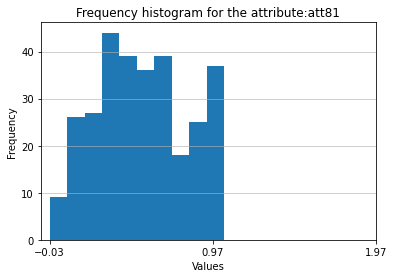

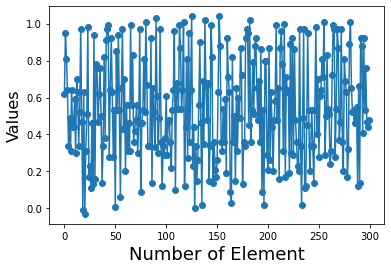

Summary statistics
Min      :  -0.03
Lower Qu.:  0.325
Median   :  0.52
Mean     :  0.537
Upper Qu.:  0.77
Max      :  1.04
OutLiers
No outliers


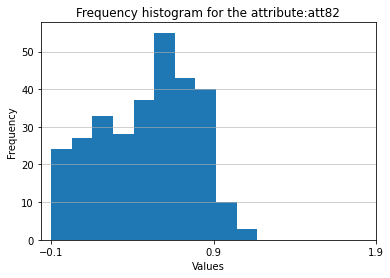

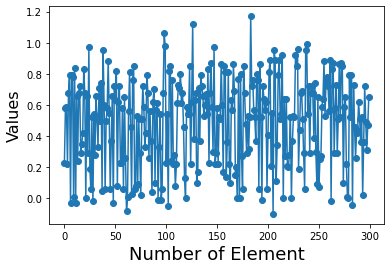

Summary statistics
Min      :  -0.1
Lower Qu.:  0.255
Median   :  0.54
Mean     :  0.49
Upper Qu.:  0.72
Max      :  1.17
OutLiers
No outliers


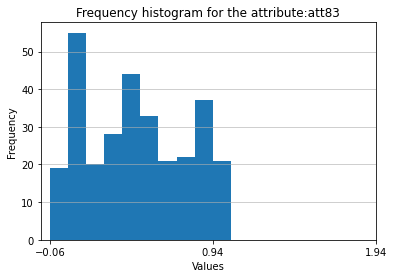

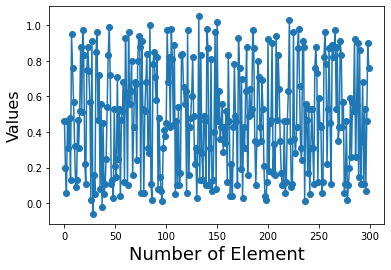

Summary statistics
Min      :  -0.06
Lower Qu.:  0.17
Median   :  0.46
Mean     :  0.472
Upper Qu.:  0.755
Max      :  1.05
OutLiers
No outliers


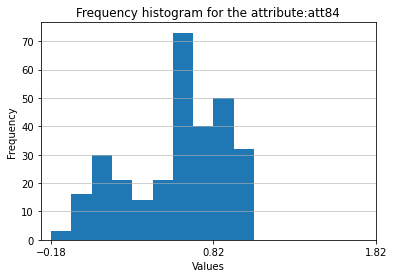

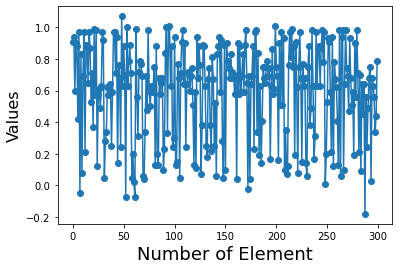

Summary statistics
Min      :  -0.18
Lower Qu.:  0.345
Median   :  0.65
Mean     :  0.594
Upper Qu.:  0.865
Max      :  1.07
OutLiers
No outliers


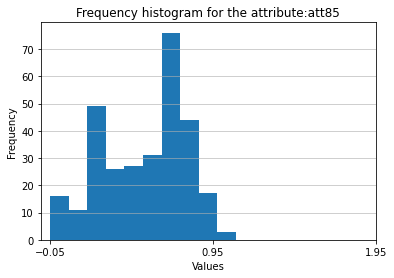

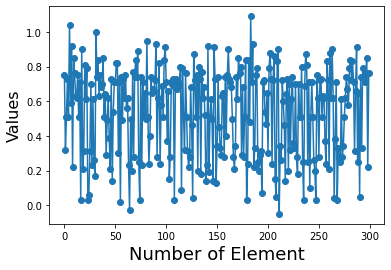

Summary statistics
Min      :  -0.05
Lower Qu.:  0.29
Median   :  0.62
Mean     :  0.539
Upper Qu.:  0.74
Max      :  1.09
OutLiers
No outliers


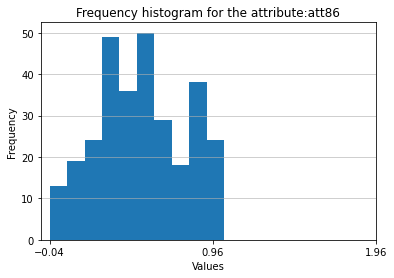

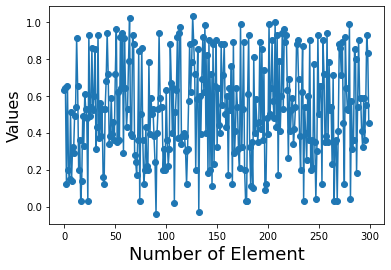

Summary statistics
Min      :  -0.04
Lower Qu.:  0.34
Median   :  0.52
Mean     :  0.521
Upper Qu.:  0.72
Max      :  1.03
OutLiers
No outliers


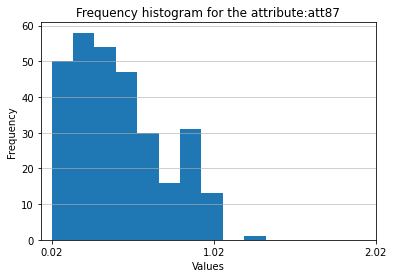

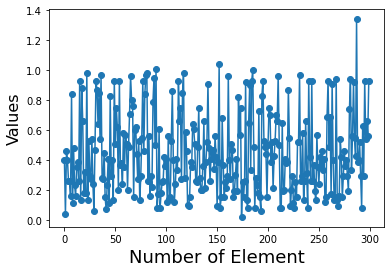

Summary statistics
Min      :  0.02
Lower Qu.:  0.225
Median   :  0.4
Mean     :  0.442
Upper Qu.:  0.61
Max      :  1.34
OutLiers
1.34


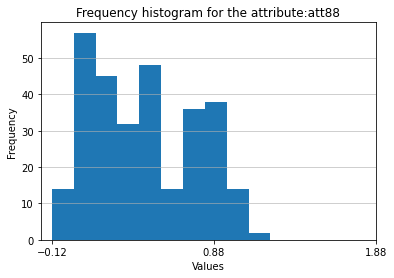

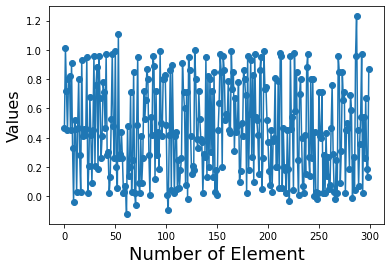

Summary statistics
Min      :  -0.12
Lower Qu.:  0.18
Median   :  0.43
Mean     :  0.451
Upper Qu.:  0.74
Max      :  1.23
OutLiers
No outliers


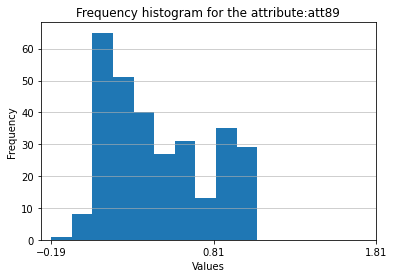

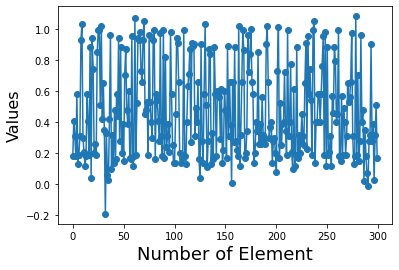

Summary statistics
Min      :  -0.19
Lower Qu.:  0.2
Median   :  0.4
Mean     :  0.472
Upper Qu.:  0.705
Max      :  1.08
OutLiers
No outliers


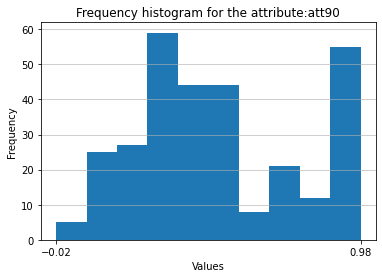

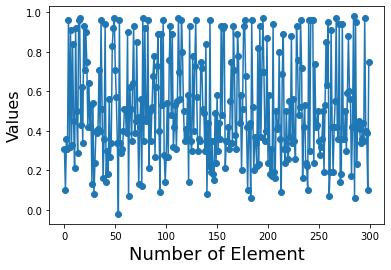

Summary statistics
Min      :  -0.02
Lower Qu.:  0.31
Median   :  0.44
Mean     :  0.509
Upper Qu.:  0.73
Max      :  0.98
OutLiers
No outliers


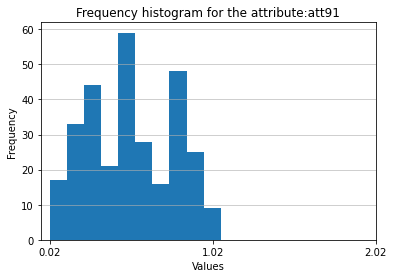

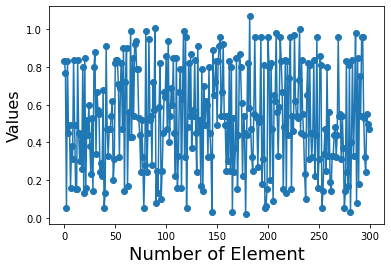

Summary statistics
Min      :  0.02
Lower Qu.:  0.31
Median   :  0.52
Mean     :  0.522
Upper Qu.:  0.8
Max      :  1.07
OutLiers
No outliers


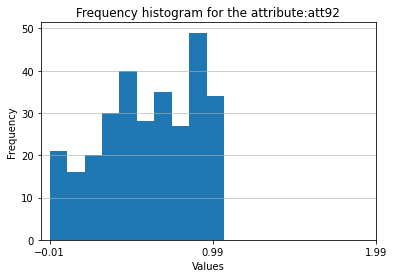

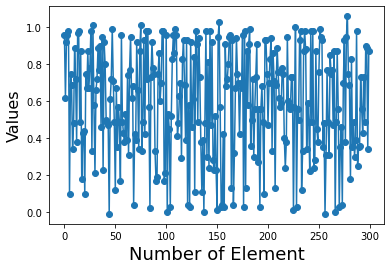

Summary statistics
Min      :  -0.01
Lower Qu.:  0.38
Median   :  0.61
Mean     :  0.591
Upper Qu.:  0.87
Max      :  1.06
OutLiers
No outliers


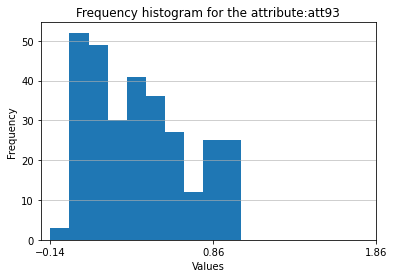

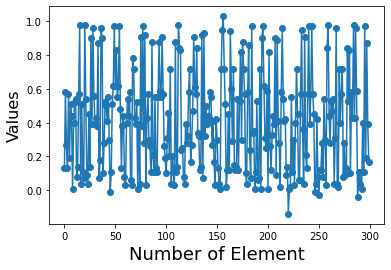

Summary statistics
Min      :  -0.14
Lower Qu.:  0.12
Median   :  0.39
Mean     :  0.409
Upper Qu.:  0.58
Max      :  1.03
OutLiers
No outliers


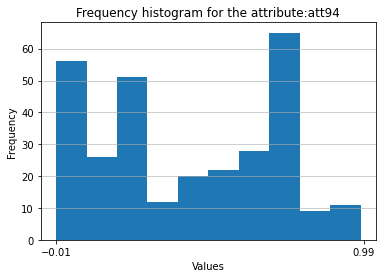

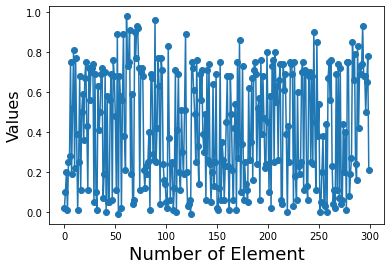

Summary statistics
Min      :  -0.01
Lower Qu.:  0.135
Median   :  0.4
Mean     :  0.415
Upper Qu.:  0.69
Max      :  0.98
OutLiers
No outliers


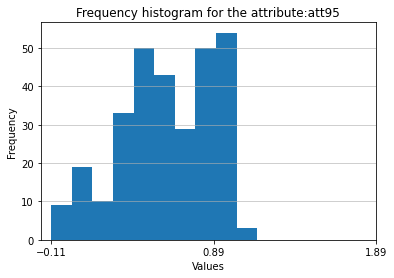

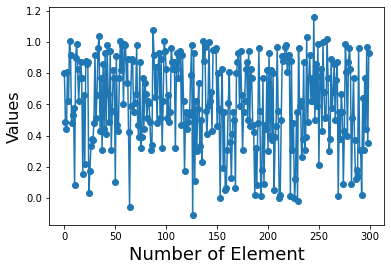

Summary statistics
Min      :  -0.11
Lower Qu.:  0.41
Median   :  0.61
Mean     :  0.605
Upper Qu.:  0.87
Max      :  1.16
OutLiers
No outliers


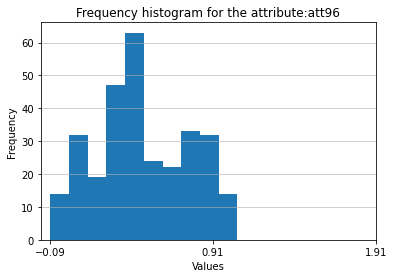

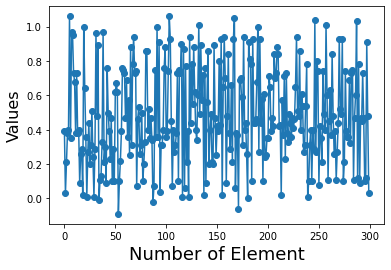

Summary statistics
Min      :  -0.09
Lower Qu.:  0.28
Median   :  0.44
Mean     :  0.48
Upper Qu.:  0.73
Max      :  1.06
OutLiers
No outliers


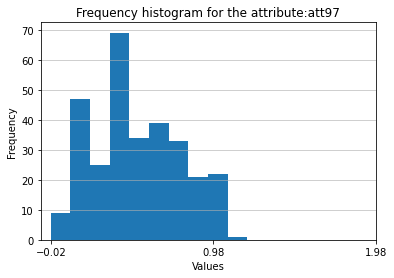

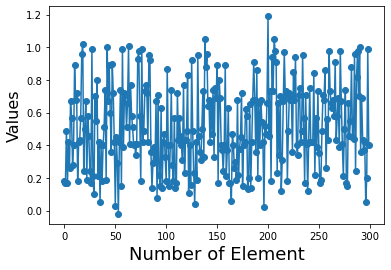

Summary statistics
Min      :  -0.02
Lower Qu.:  0.32
Median   :  0.46499999999999997
Mean     :  0.513
Upper Qu.:  0.71
Max      :  1.19
OutLiers
No outliers


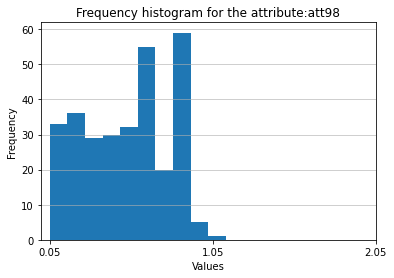

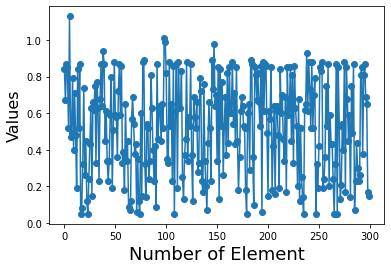

Summary statistics
Min      :  0.05
Lower Qu.:  0.32
Median   :  0.53
Mean     :  0.523
Upper Qu.:  0.745
Max      :  1.13
OutLiers
No outliers


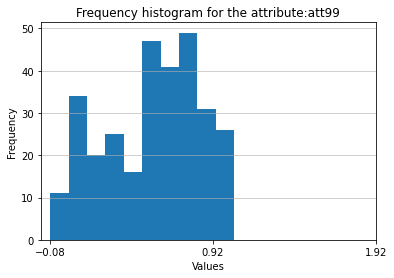

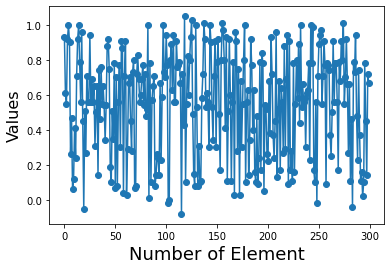

Summary statistics
Min      :  -0.08
Lower Qu.:  0.29
Median   :  0.58
Mean     :  0.554
Upper Qu.:  0.78
Max      :  1.05
OutLiers
No outliers


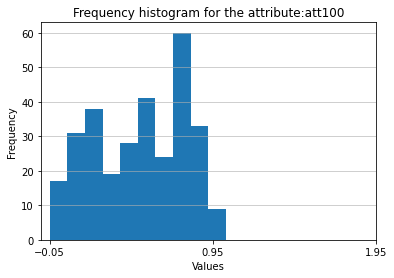

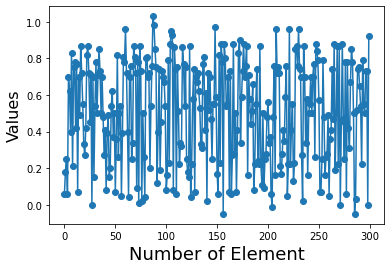

Summary statistics
Min      :  -0.05
Lower Qu.:  0.25
Median   :  0.535
Mean     :  0.504
Upper Qu.:  0.75
Max      :  1.03
OutLiers
No outliers


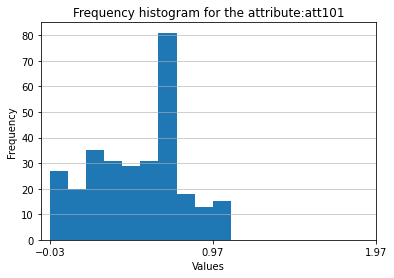

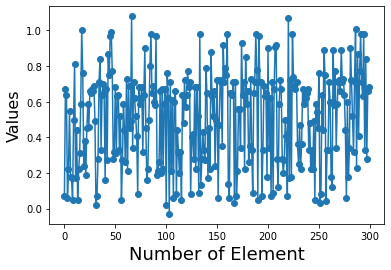

Summary statistics
Min      :  -0.03
Lower Qu.:  0.275
Median   :  0.59
Mean     :  0.506
Upper Qu.:  0.71
Max      :  1.08
OutLiers
No outliers


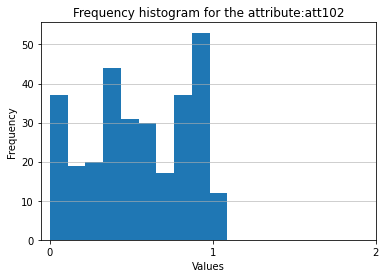

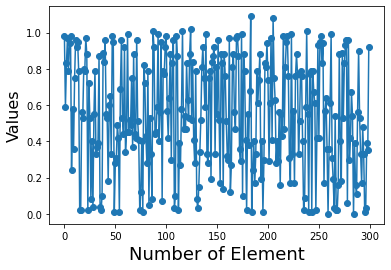

Summary statistics
Min      :  0.0
Lower Qu.:  0.315
Median   :  0.54
Mean     :  0.547
Upper Qu.:  0.83
Max      :  1.09
OutLiers
No outliers


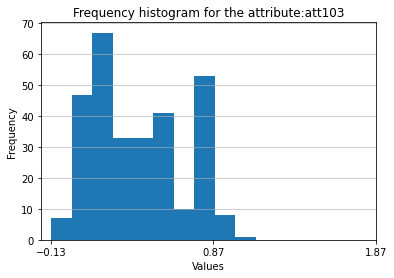

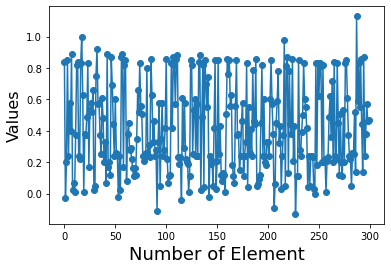

Summary statistics
Min      :  -0.13
Lower Qu.:  0.2
Median   :  0.37
Mean     :  0.413
Upper Qu.:  0.61
Max      :  1.13
OutLiers
No outliers


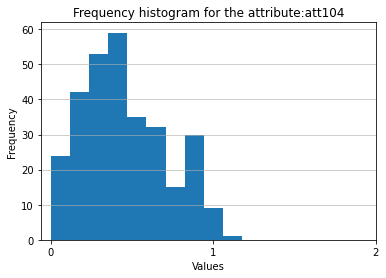

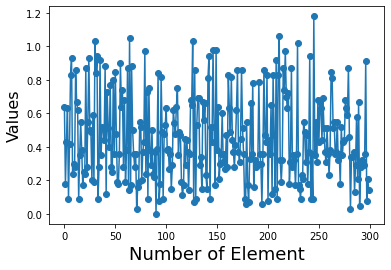

Summary statistics
Min      :  0.0
Lower Qu.:  0.28
Median   :  0.38
Mean     :  0.452
Upper Qu.:  0.635
Max      :  1.18
OutLiers
1.18


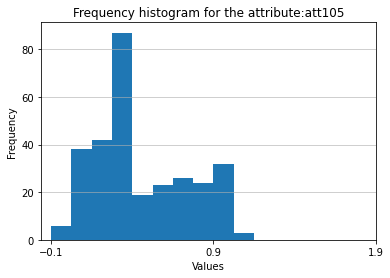

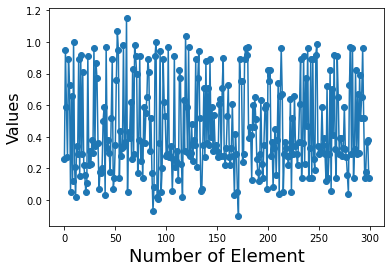

Summary statistics
Min      :  -0.1
Lower Qu.:  0.255
Median   :  0.35
Mean     :  0.454
Upper Qu.:  0.705
Max      :  1.15
OutLiers
No outliers


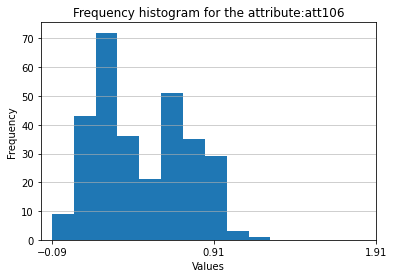

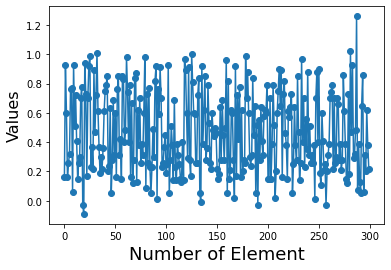

Summary statistics
Min      :  -0.09
Lower Qu.:  0.235
Median   :  0.4
Mean     :  0.467
Upper Qu.:  0.7
Max      :  1.26
OutLiers
No outliers


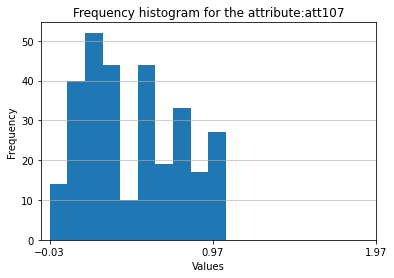

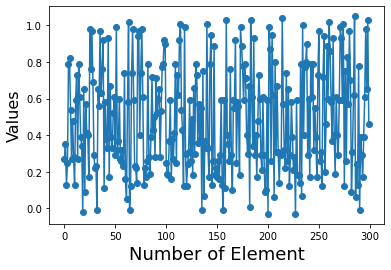

Summary statistics
Min      :  -0.03
Lower Qu.:  0.26
Median   :  0.405
Mean     :  0.485
Upper Qu.:  0.73
Max      :  1.05
OutLiers
No outliers


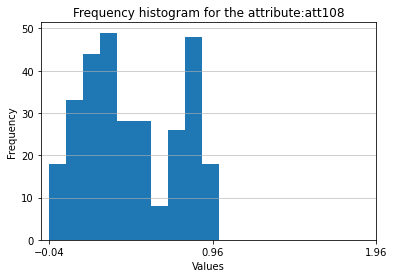

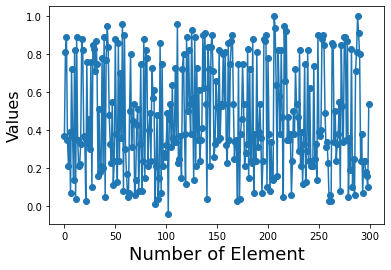

Summary statistics
Min      :  -0.04
Lower Qu.:  0.24
Median   :  0.38
Mean     :  0.463
Upper Qu.:  0.75
Max      :  1.0
OutLiers
No outliers


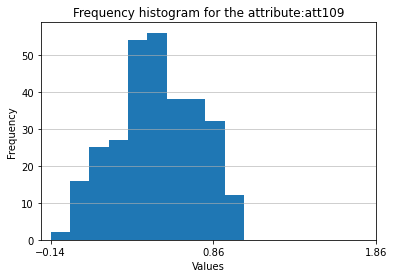

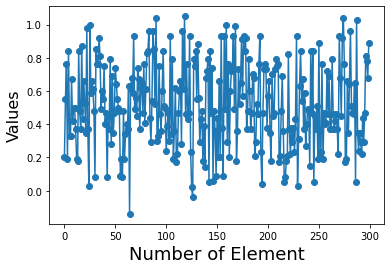

Summary statistics
Min      :  -0.14
Lower Qu.:  0.35
Median   :  0.48
Mean     :  0.516
Upper Qu.:  0.73
Max      :  1.05
OutLiers
No outliers


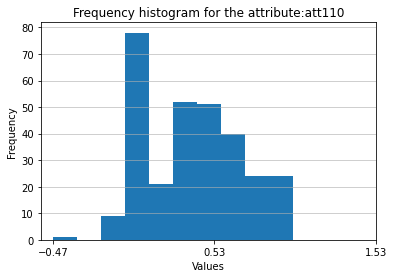

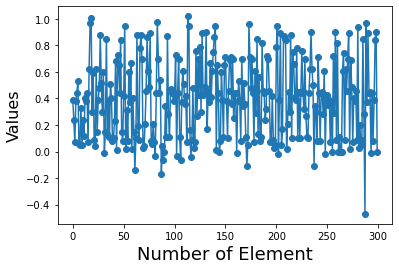

Summary statistics
Min      :  -0.47
Lower Qu.:  0.1
Median   :  0.395
Mean     :  0.394
Upper Qu.:  0.62
Max      :  1.02
OutLiers
No outliers


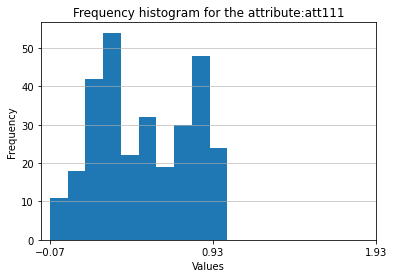

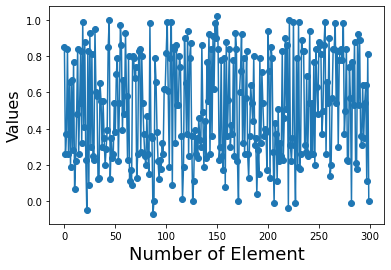

Summary statistics
Min      :  -0.07
Lower Qu.:  0.26
Median   :  0.485
Mean     :  0.508
Upper Qu.:  0.8
Max      :  1.02
OutLiers
No outliers


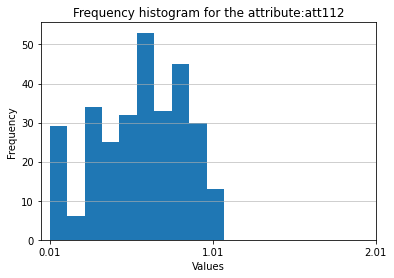

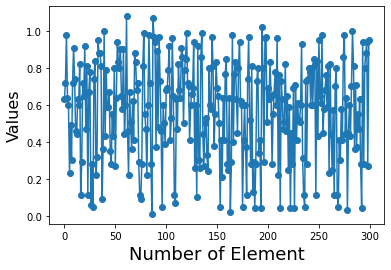

Summary statistics
Min      :  0.01
Lower Qu.:  0.37
Median   :  0.6
Mean     :  0.569
Upper Qu.:  0.8
Max      :  1.08
OutLiers
No outliers


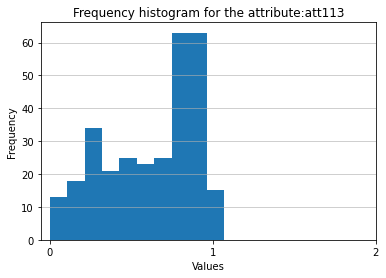

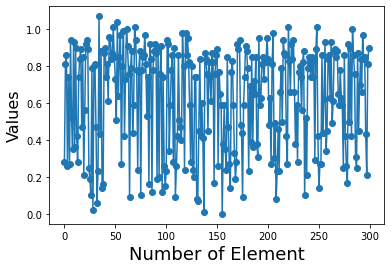

Summary statistics
Min      :  0.0
Lower Qu.:  0.385
Median   :  0.74
Mean     :  0.624
Upper Qu.:  0.86
Max      :  1.07
OutLiers
No outliers


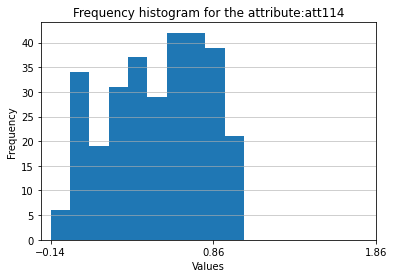

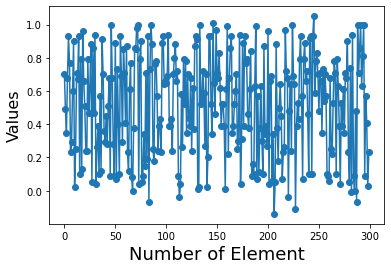

Summary statistics
Min      :  -0.14
Lower Qu.:  0.25
Median   :  0.56
Mean     :  0.516
Upper Qu.:  0.77
Max      :  1.05
OutLiers
No outliers


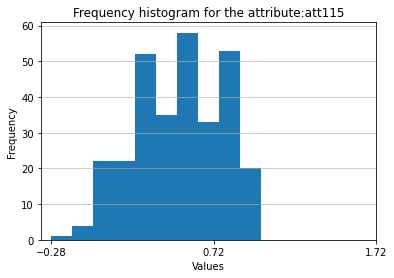

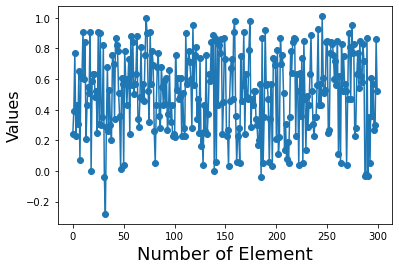

Summary statistics
Min      :  -0.28
Lower Qu.:  0.295
Median   :  0.52
Mean     :  0.511
Upper Qu.:  0.745
Max      :  1.01
OutLiers
No outliers


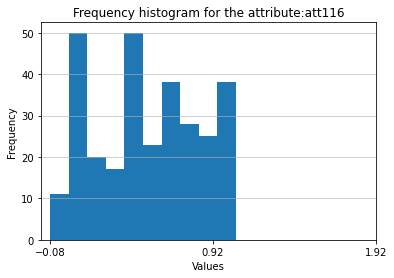

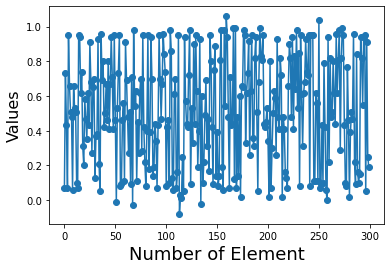

Summary statistics
Min      :  -0.08
Lower Qu.:  0.22
Median   :  0.505
Mean     :  0.516
Upper Qu.:  0.8
Max      :  1.06
OutLiers
No outliers


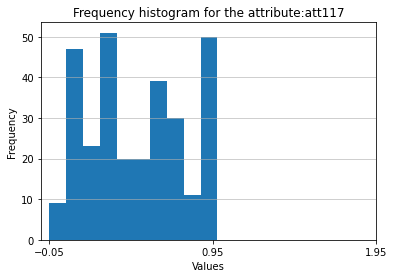

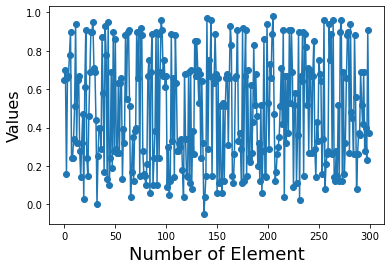

Summary statistics
Min      :  -0.05
Lower Qu.:  0.24
Median   :  0.46499999999999997
Mean     :  0.485
Upper Qu.:  0.695
Max      :  0.98
OutLiers
No outliers


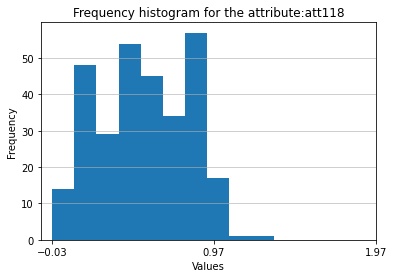

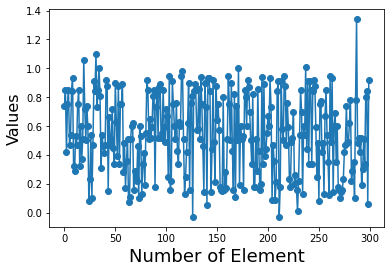

Summary statistics
Min      :  -0.03
Lower Qu.:  0.32
Median   :  0.52
Mean     :  0.542
Upper Qu.:  0.8
Max      :  1.34
OutLiers
No outliers


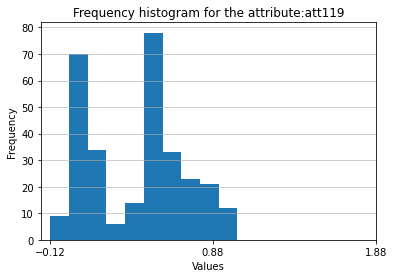

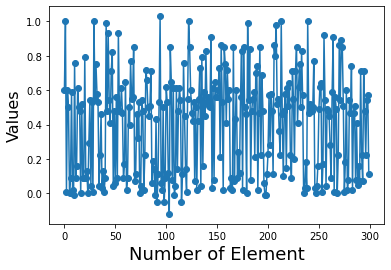

Summary statistics
Min      :  -0.12
Lower Qu.:  0.09
Median   :  0.48
Mean     :  0.408
Upper Qu.:  0.6
Max      :  1.03
OutLiers
No outliers


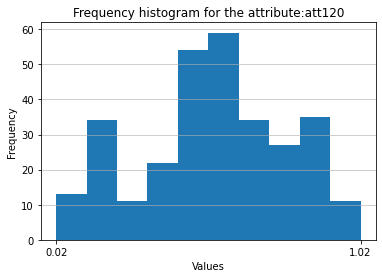

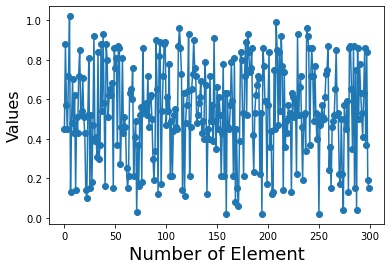

Summary statistics
Min      :  0.02
Lower Qu.:  0.4
Median   :  0.53
Mean     :  0.536
Upper Qu.:  0.72
Max      :  1.02
OutLiers
No outliers


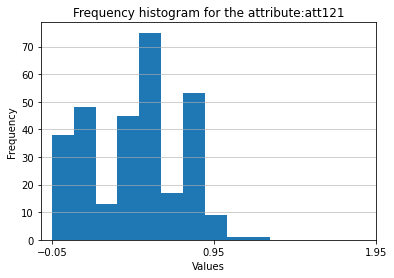

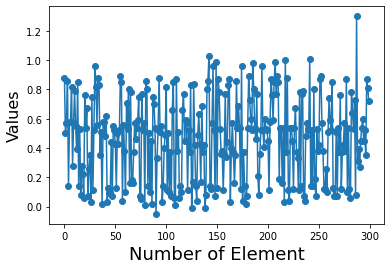

Summary statistics
Min      :  -0.05
Lower Qu.:  0.15000000000000002
Median   :  0.51
Mean     :  0.462
Upper Qu.:  0.6799999999999999
Max      :  1.3
OutLiers
No outliers


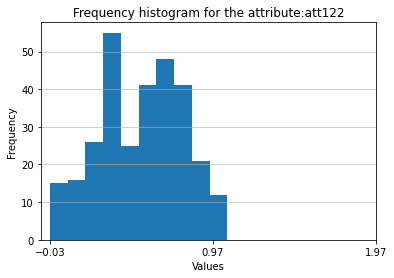

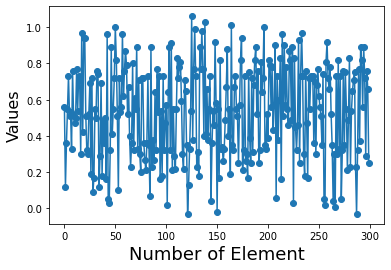

Summary statistics
Min      :  -0.03
Lower Qu.:  0.32
Median   :  0.545
Mean     :  0.531
Upper Qu.:  0.73
Max      :  1.06
OutLiers
No outliers


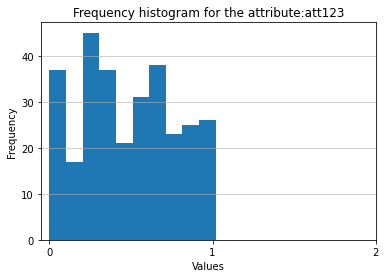

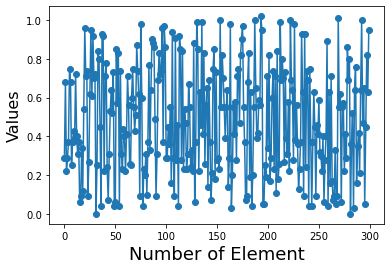

Summary statistics
Min      :  0.0
Lower Qu.:  0.25
Median   :  0.455
Mean     :  0.484
Upper Qu.:  0.71
Max      :  1.02
OutLiers
No outliers


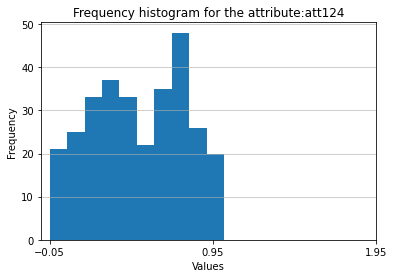

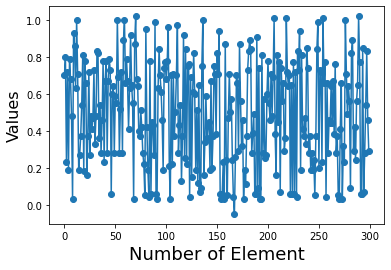

Summary statistics
Min      :  -0.05
Lower Qu.:  0.265
Median   :  0.49
Mean     :  0.494
Upper Qu.:  0.725
Max      :  1.02
OutLiers
No outliers


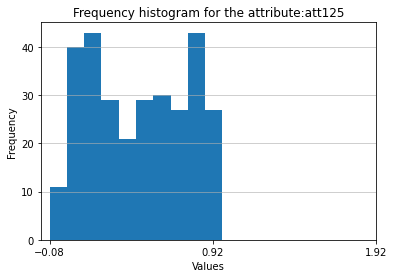

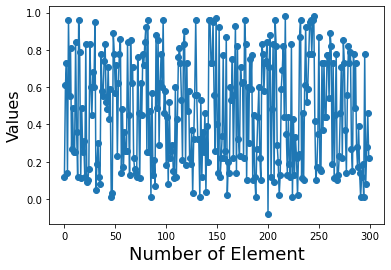

Summary statistics
Min      :  -0.08
Lower Qu.:  0.195
Median   :  0.46
Mean     :  0.469
Upper Qu.:  0.74
Max      :  0.98
OutLiers
No outliers


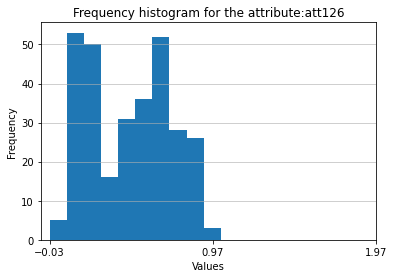

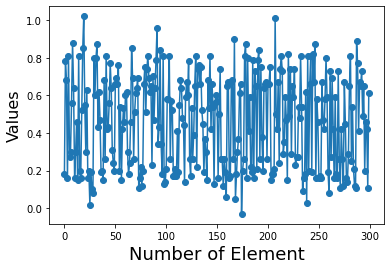

Summary statistics
Min      :  -0.03
Lower Qu.:  0.2
Median   :  0.47
Mean     :  0.461
Upper Qu.:  0.67
Max      :  1.02
OutLiers
No outliers


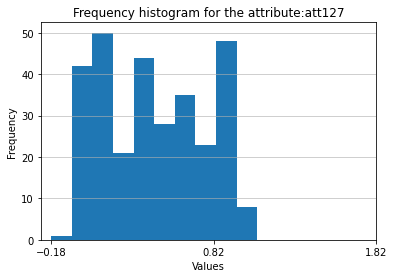

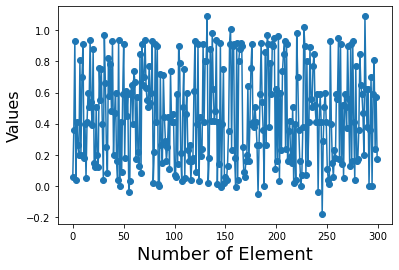

Summary statistics
Min      :  -0.18
Lower Qu.:  0.165
Median   :  0.41
Mean     :  0.457
Upper Qu.:  0.74
Max      :  1.09
OutLiers
No outliers


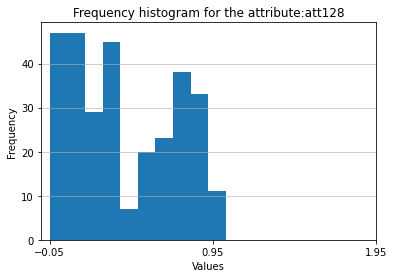

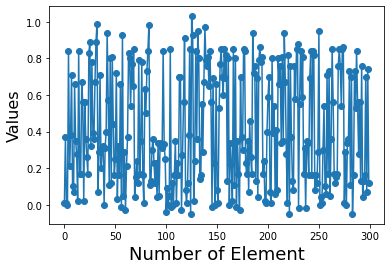

Summary statistics
Min      :  -0.05
Lower Qu.:  0.13
Median   :  0.35
Mean     :  0.413
Upper Qu.:  0.73
Max      :  1.03
OutLiers
No outliers


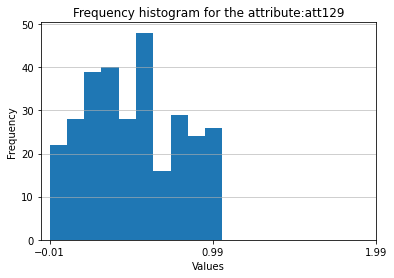

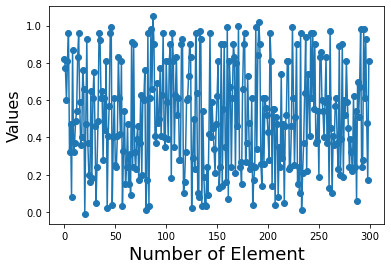

Summary statistics
Min      :  -0.01
Lower Qu.:  0.245
Median   :  0.485
Mean     :  0.506
Upper Qu.:  0.76
Max      :  1.05
OutLiers
No outliers


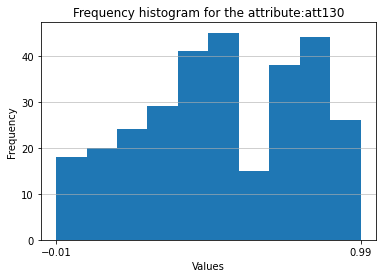

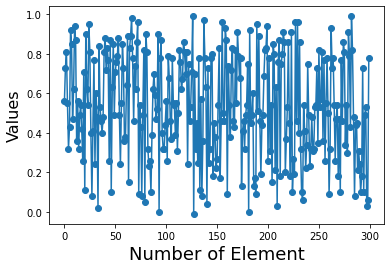

Summary statistics
Min      :  -0.01
Lower Qu.:  0.32
Median   :  0.53
Mean     :  0.534
Upper Qu.:  0.78
Max      :  0.99
OutLiers
No outliers


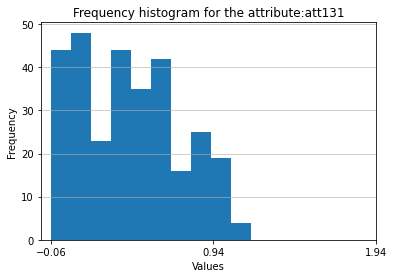

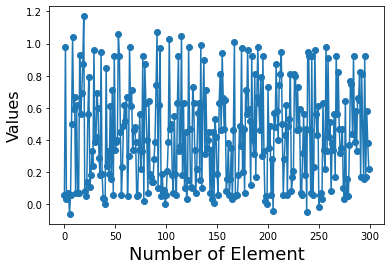

Summary statistics
Min      :  -0.06
Lower Qu.:  0.155
Median   :  0.4
Mean     :  0.426
Upper Qu.:  0.63
Max      :  1.17
OutLiers
No outliers


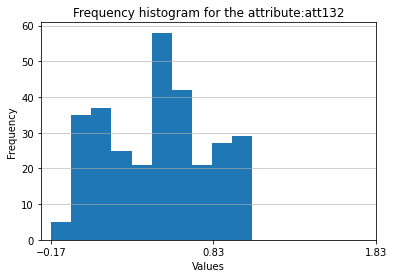

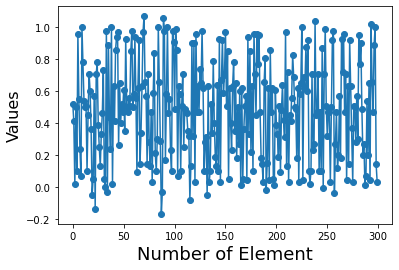

Summary statistics
Min      :  -0.17
Lower Qu.:  0.2
Median   :  0.495
Mean     :  0.479
Upper Qu.:  0.71
Max      :  1.07
OutLiers
No outliers


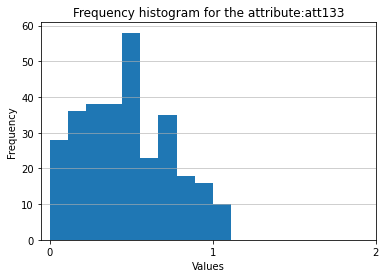

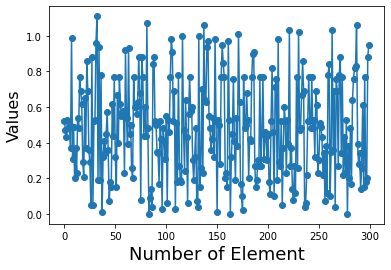

Summary statistics
Min      :  0.0
Lower Qu.:  0.26
Median   :  0.47
Mean     :  0.476
Upper Qu.:  0.685
Max      :  1.11
OutLiers
No outliers


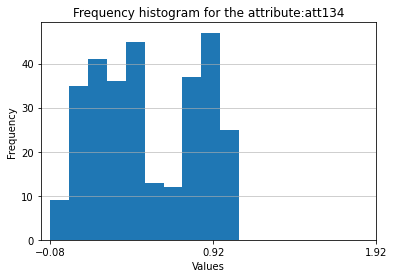

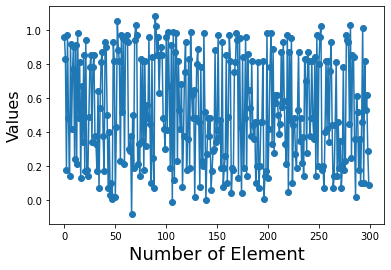

Summary statistics
Min      :  -0.08
Lower Qu.:  0.21
Median   :  0.48
Mean     :  0.522
Upper Qu.:  0.84
Max      :  1.08
OutLiers
No outliers


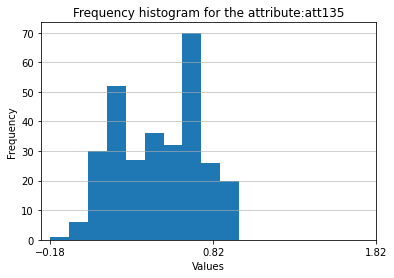

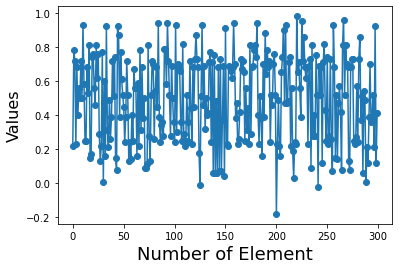

Summary statistics
Min      :  -0.18
Lower Qu.:  0.25
Median   :  0.51
Mean     :  0.492
Upper Qu.:  0.71
Max      :  0.98
OutLiers
No outliers


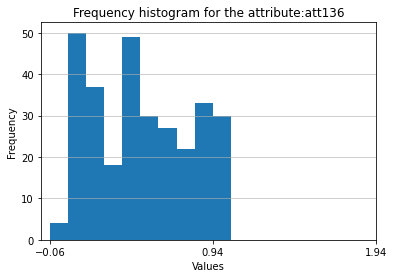

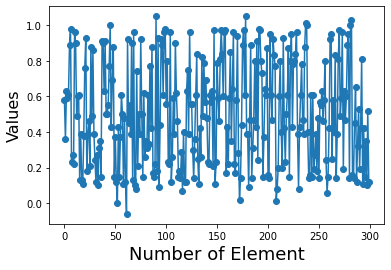

Summary statistics
Min      :  -0.06
Lower Qu.:  0.225
Median   :  0.47
Mean     :  0.504
Upper Qu.:  0.79
Max      :  1.05
OutLiers
No outliers


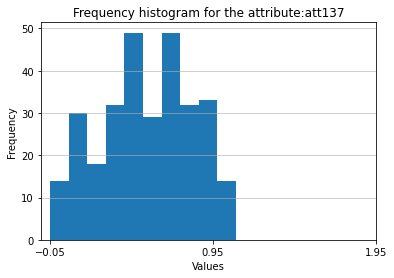

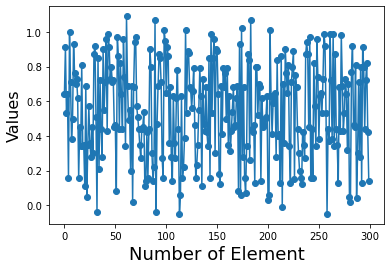

Summary statistics
Min      :  -0.05
Lower Qu.:  0.34
Median   :  0.535
Mean     :  0.542
Upper Qu.:  0.765
Max      :  1.09
OutLiers
No outliers


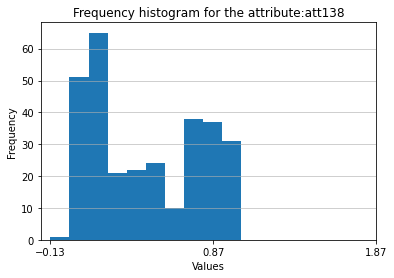

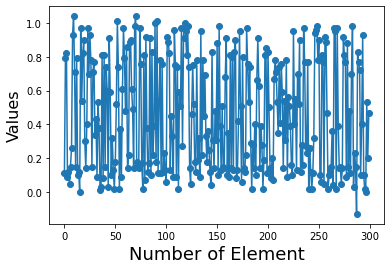

Summary statistics
Min      :  -0.13
Lower Qu.:  0.135
Median   :  0.39
Mean     :  0.455
Upper Qu.:  0.78
Max      :  1.04
OutLiers
No outliers


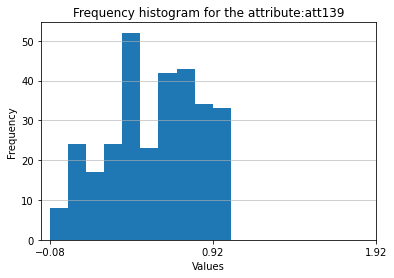

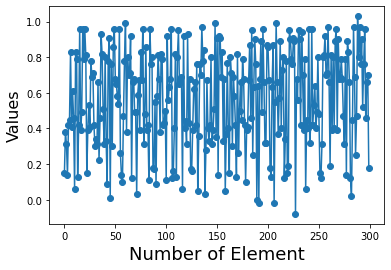

Summary statistics
Min      :  -0.08
Lower Qu.:  0.375
Median   :  0.615
Mean     :  0.561
Upper Qu.:  0.8
Max      :  1.03
OutLiers
No outliers


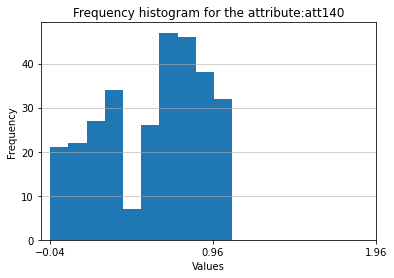

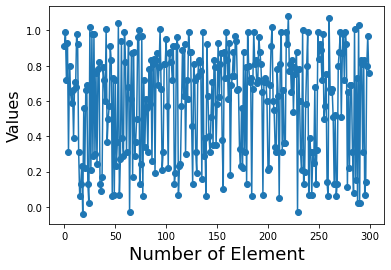

Summary statistics
Min      :  -0.04
Lower Qu.:  0.31
Median   :  0.67
Mean     :  0.588
Upper Qu.:  0.83
Max      :  1.08
OutLiers
No outliers


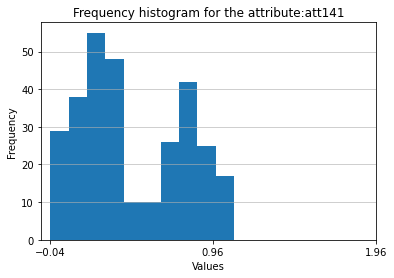

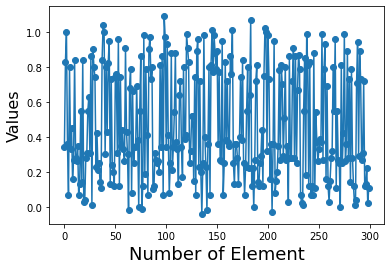

Summary statistics
Min      :  -0.04
Lower Qu.:  0.22
Median   :  0.36
Mean     :  0.464
Upper Qu.:  0.79
Max      :  1.09
OutLiers
No outliers


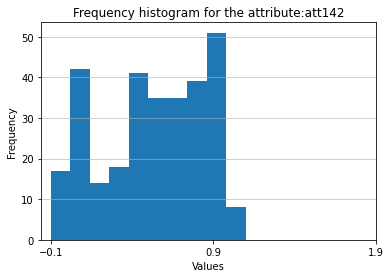

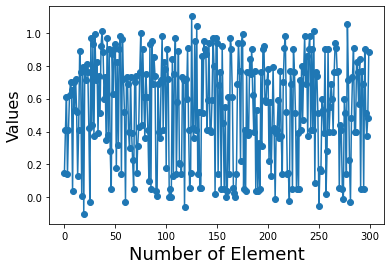

Summary statistics
Min      :  -0.1
Lower Qu.:  0.29000000000000004
Median   :  0.58
Mean     :  0.532
Upper Qu.:  0.78
Max      :  1.1
OutLiers
No outliers


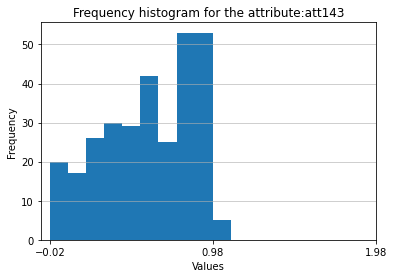

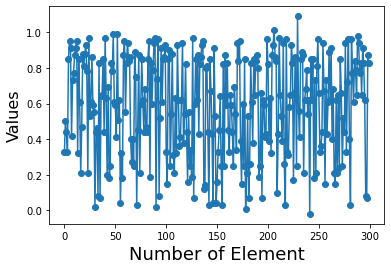

Summary statistics
Min      :  -0.02
Lower Qu.:  0.335
Median   :  0.62
Mean     :  0.581
Upper Qu.:  0.85
Max      :  1.09
OutLiers
No outliers


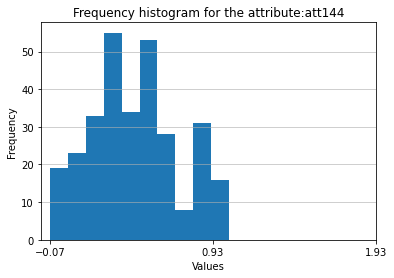

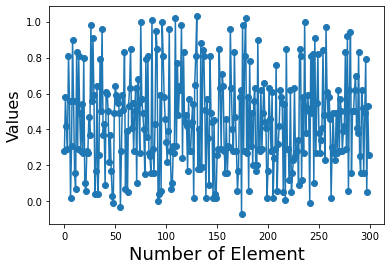

Summary statistics
Min      :  -0.07
Lower Qu.:  0.265
Median   :  0.44
Mean     :  0.445
Upper Qu.:  0.62
Max      :  1.03
OutLiers
No outliers


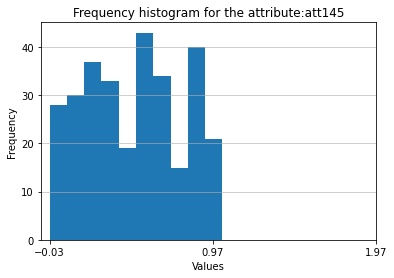

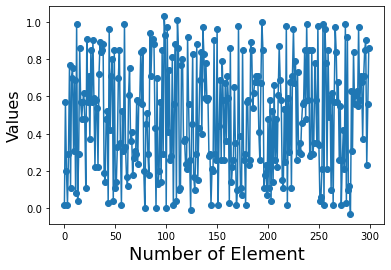

Summary statistics
Min      :  -0.03
Lower Qu.:  0.235
Median   :  0.52
Mean     :  0.488
Upper Qu.:  0.725
Max      :  1.03
OutLiers
No outliers


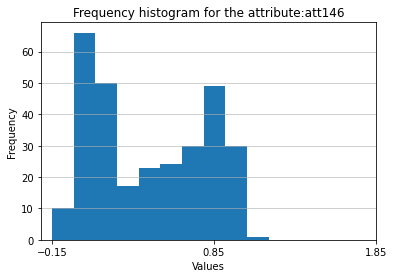

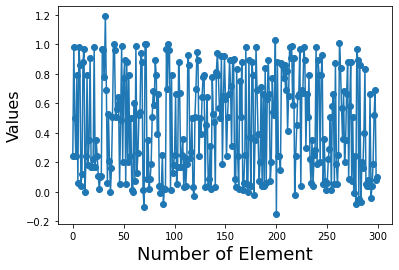

Summary statistics
Min      :  -0.15
Lower Qu.:  0.11
Median   :  0.45999999999999996
Mean     :  0.455
Upper Qu.:  0.79
Max      :  1.19
OutLiers
No outliers


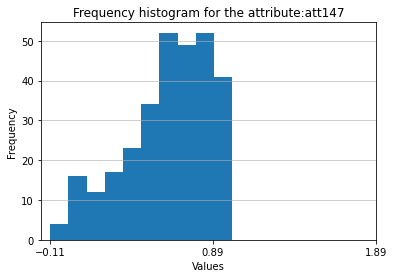

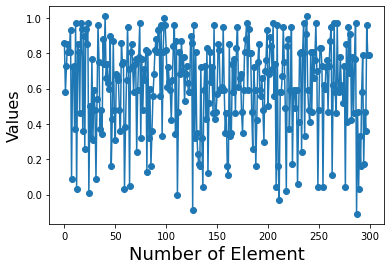

Summary statistics
Min      :  -0.11
Lower Qu.:  0.46
Median   :  0.65
Mean     :  0.61
Upper Qu.:  0.81
Max      :  1.01
OutLiers
-0.09
-0.11


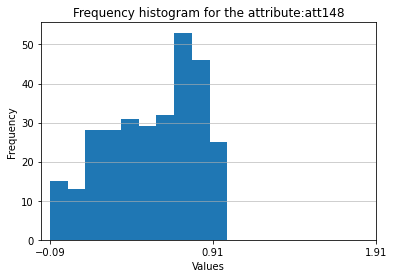

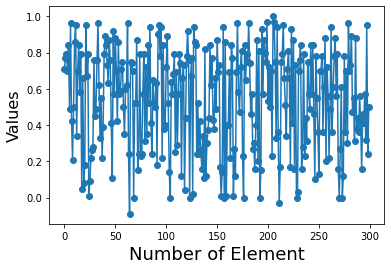

Summary statistics
Min      :  -0.09
Lower Qu.:  0.305
Median   :  0.57
Mean     :  0.539
Upper Qu.:  0.78
Max      :  1.0
OutLiers
No outliers


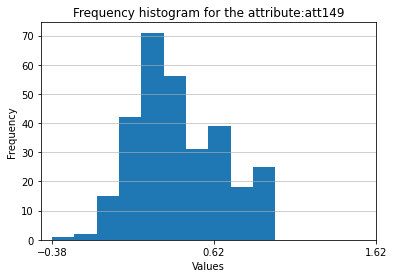

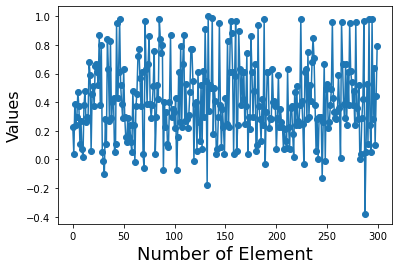

Summary statistics
Min      :  -0.38
Lower Qu.:  0.23
Median   :  0.37
Mean     :  0.403
Upper Qu.:  0.61
Max      :  1.0
OutLiers
-0.38


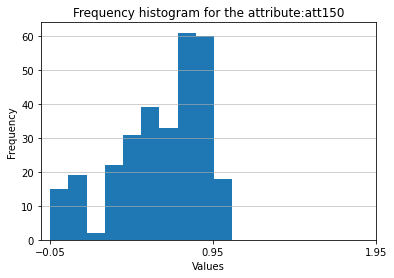

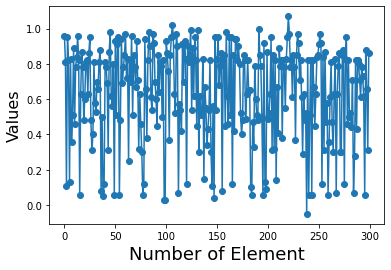

Summary statistics
Min      :  -0.05
Lower Qu.:  0.47
Median   :  0.69
Mean     :  0.632
Upper Qu.:  0.85
Max      :  1.07
OutLiers
No outliers


In [4]:
 # Turning information into histograms
i = 0
for attributeData in dataPerAttribute:
    n = len(dataPerAttribute[i])
    k = math.ceil(1+3.32*math.log2(n))
    k = min(k,10)
    rangeData = max(dataPerAttribute[i])-min(dataPerAttribute[i])
    binsWidth = rangeData / k
    binsWidth = math.ceil(binsWidth)
    if  binsWidth == 0.0:
        binsWidth = 1.0
    
    plt.hist(dataPerAttribute[i], bins=k,align='mid')
    plt.grid(axis='y', alpha=0.75)
    plt.ylabel('Frequency')
    plt.xlabel('Values')
    plt.xticks(np.arange(min(dataPerAttribute[i]), max(dataPerAttribute[i])+1, binsWidth))
    plt.title('Frequency histogram for the attribute:' + attributesName[i])
    plt.show()
    plt.plot(dataPerAttribute[i],"-o")
    plt.xlabel('Number of Element', fontsize=18)
    plt.ylabel('Values', fontsize=16)
    plt.show()

    summary(dataPerAttribute[i])
    q1,q3 = quartiles(dataPerAttribute[i])
    iqr = q3 - q1
    lower_bound = q1 -(1.5 * iqr) 
    upper_bound = q3 +(1.5 * iqr)
    outLiers = outlierDetection(lower_bound,upper_bound,dataPerAttribute[i])
    print("OutLiers")
    if len(outLiers) == 0:
        print("No outliers")
    else:
        for outLier in outLiers:
            print(outLier)
    i += 1